In [1]:
from sklearn.datasets import fetch_openml
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import normalized_mutual_info_score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
import pandas as pd
import time
from sklearn.metrics import confusion_matrix
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D  
from sklearn.preprocessing import StandardScaler
import matplotlib.cm as cm
from scipy.optimize import linear_sum_assignment
from sklearn.cluster import AgglomerativeClustering
from sklearn.utils import resample
from sklearn.mixture import GaussianMixture

In [2]:
# Fetch the MNIST dataset
mnist = fetch_openml('mnist_784', version=1)

# Images pixel
X = mnist.data.astype('float32')  
# Digits labels
y = mnist.target.astype('int64')  

print("Data shape:", X.shape)
print("Label shape:", y.shape)

C:\Users\Admin\anaconda3\Lib\site-packages\sklearn\datasets\_openml.py:968: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


Data shape: (70000, 784)
Label shape: (70000,)


In [3]:
X

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
y

0        5
1        0
2        4
3        1
4        9
        ..
69995    2
69996    3
69997    4
69998    5
69999    6
Name: class, Length: 70000, dtype: int64

In [5]:
# Example of first row of pixel values
# mnist.data.iloc[0].values
# shape =28*28 = 784
X.iloc[0].values

array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   

In [6]:
# Example of the label of first row
# mnist.target.iloc[0]
y.iloc[0]

5

In [7]:
# reshape back to 2D image format 28x28
X.iloc[0].values.reshape(28, 28)  

array([[  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0

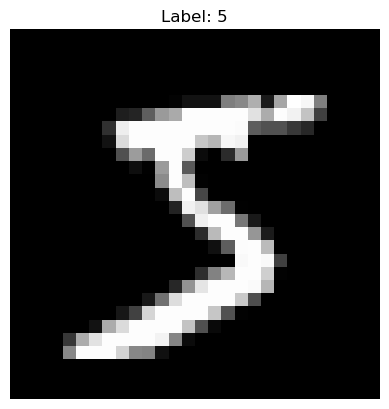

In [8]:
# Show the first image
plt.imshow(X.iloc[0].values.reshape(28, 28), cmap='gray')
plt.title(f"Label: {y[0]}")
plt.axis('off')
plt.show()

In [9]:
digit=5
print(np.where(y == digit))         # Show full output (tuple) total of 5
print(np.where(y == digit)[0])      # Show array of matching indices total of 5
print(np.where(y == digit)[0][0])   # First matching index

(array([    0,    11,    35, ..., 69982, 69988, 69998], dtype=int64),)
[    0    11    35 ... 69982 69988 69998]
0


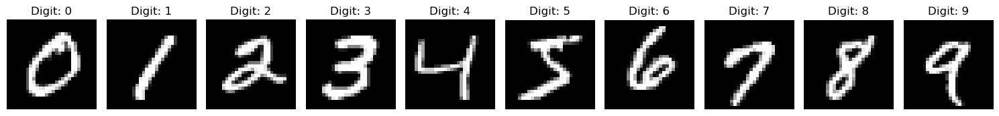

In [10]:
# Plot one example per digit (0 to 9)
fig, axes = plt.subplots(1, 10, figsize=(15, 4))

for digit in range(10):
    # Find the index of the first occurrence of this digit
    index = np.where(y == digit)[0][0]
    axes[digit].imshow(X.iloc[index].values.reshape(28, 28), cmap='gray')
    axes[digit].set_title(f"Digit: {digit}")
    axes[digit].axis('off')

plt.tight_layout()
plt.show()

In [11]:
# Normalize pixel values
# Flatten it
X = X / 255.0  

In [12]:
X.iloc[0].values

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

In [13]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [14]:
X_scaled

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [15]:
pca_2d = PCA(n_components=2)
pca_3d = PCA(n_components=3)
pca_4d = PCA(n_components=4)
pca_5d = PCA(n_components=5)
pca_6d = PCA(n_components=6)
pca_7d = PCA(n_components=7)
pca_8d = PCA(n_components=8)
pca_9d = PCA(n_components=9)
pca_10d = PCA(n_components=10)
pca_50d = PCA(n_components=50)
pca_150d = PCA(n_components=150)

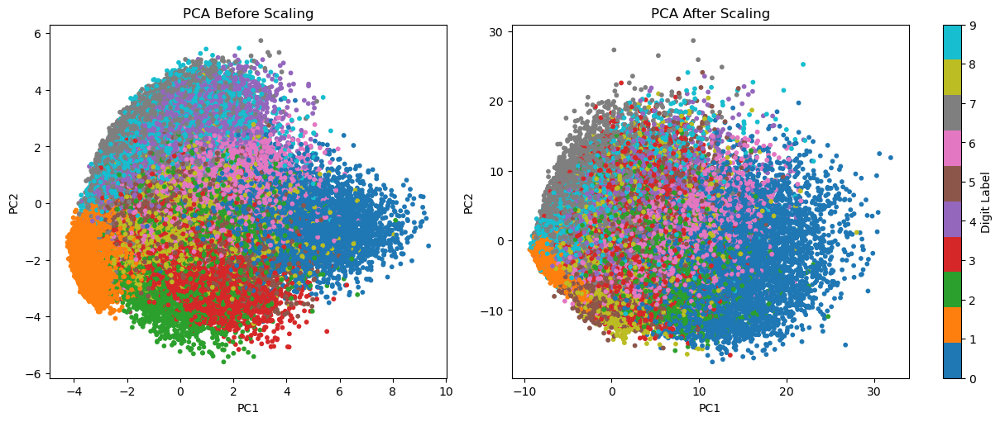

In [16]:
# plot the pca dimsion to see the diffrence between the standardize and without standardize
# PCA before scaling
X_pca_before = pca_2d.fit_transform(X)

# PCA after scaling
X_pca_after = pca_2d.fit_transform(X_scaled)

# plotting
fig, axes = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

# Before scaling
scatter1 = axes[0].scatter(X_pca_before[:, 0], X_pca_before[:, 1], c=y, cmap='tab10', s=10)
axes[0].set_title("PCA Before Scaling")
axes[0].set_xlabel("PC1")
axes[0].set_ylabel("PC2")

# After scaling
scatter2 = axes[1].scatter(X_pca_after[:, 0], X_pca_after[:, 1], c=y, cmap='tab10', s=10)
axes[1].set_title("PCA After Scaling")
axes[1].set_xlabel("PC1")
axes[1].set_ylabel("PC2")

# Shared colorbar for both plots
cbar = fig.colorbar(scatter2, ax=axes, orientation="vertical", fraction=0.025, pad=0.04)
cbar.set_label("Digit Label")
plt.show()

# Kmeans
### Find the optimal K

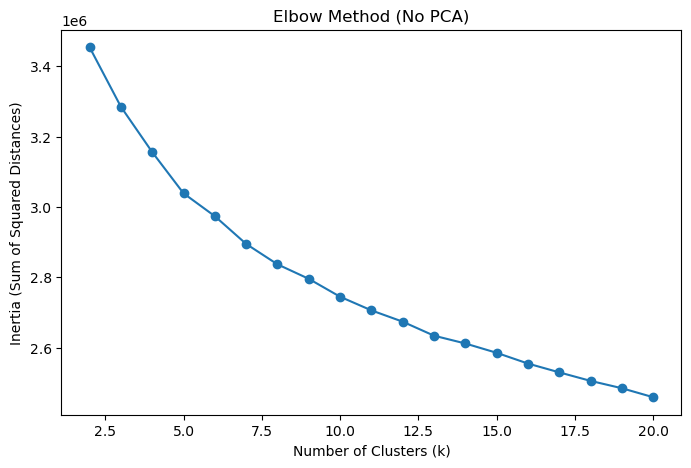

In [13]:
inertia = []

for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X)  # Using full 784-dimensional data
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(2, 21), inertia, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (Sum of Squared Distances)")
plt.title("Elbow Method (No PCA)")
plt.show()

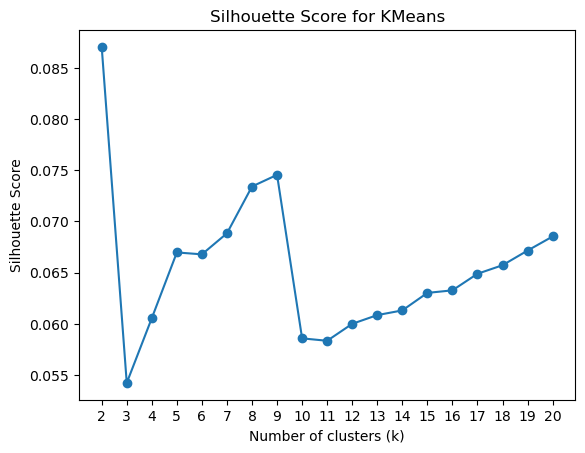

In [27]:
sil_scores = []

for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(X)
    score = silhouette_score(X, labels)
    sil_scores.append(score)

plt.plot(range(2, 21), sil_scores, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for KMeans')
plt.xticks(range(2, 21))
plt.show()

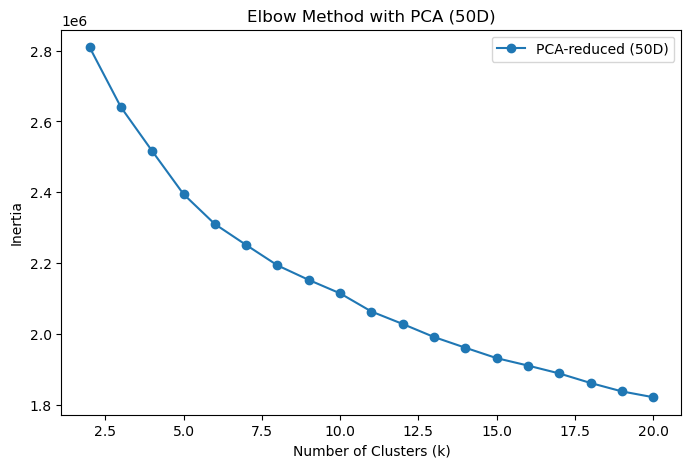

In [33]:
pca = PCA(n_components=50)
X_pca = pca.fit_transform(X)

inertia_pca = []
for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_pca)
    inertia_pca.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(2, 21), inertia_pca, marker='o', label='PCA-reduced (50D)')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method with PCA (50D)")
plt.legend()
plt.show()

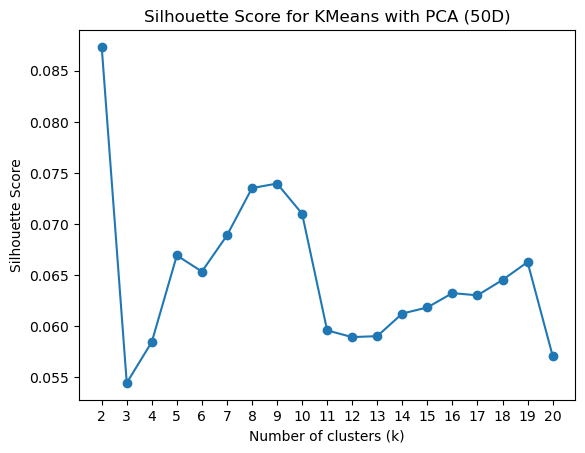

In [30]:
sil_scores = []

for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(X_pca)
    score = silhouette_score(X, labels)
    sil_scores.append(score)

plt.plot(range(2, 21), sil_scores, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for KMeans with PCA (50D)')
plt.xticks(range(2, 21))
plt.show()

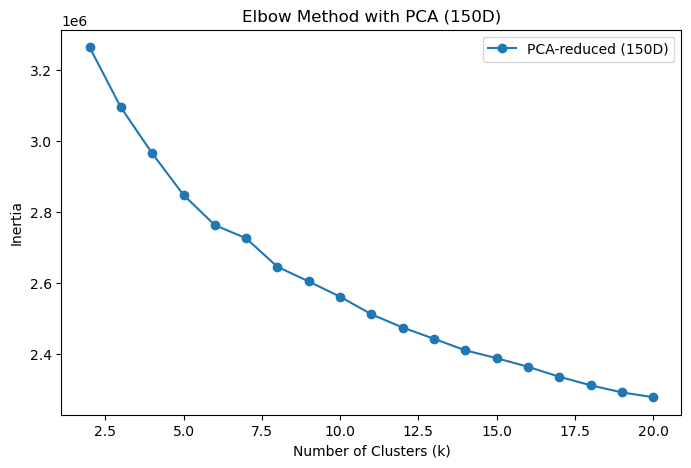

In [31]:
pca = PCA(n_components=150)
X_pca = pca.fit_transform(X)

inertia_pca = []
for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_pca)
    inertia_pca.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(2, 21), inertia_pca, marker='o', label='PCA-reduced (150D)')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method with PCA (150D)")
plt.legend()
plt.show()

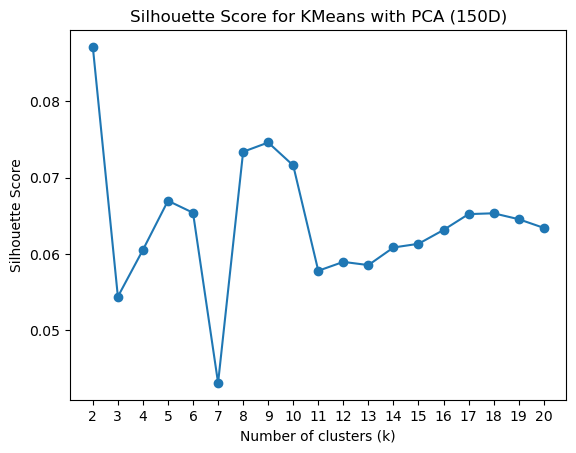

In [32]:
sil_scores = []

for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(X_pca)
    score = silhouette_score(X, labels)
    sil_scores.append(score)

plt.plot(range(2, 21), sil_scores, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for KMeans with PCA (150D)')
plt.xticks(range(2, 21))
plt.show()

In [69]:
def compute_inertia_scores(X, k_values):
    inertia_scores = []
    for k in k_values:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
        kmeans.fit(X)
        inertia_scores.append(kmeans.inertia_)
    return inertia_scores

In [70]:
k_values = range(2, 21)

# Store results
inertia_results = {}

# Original data (784D)
print("\nInertia: No PCA (784D)")
start_time = time.time()
inertia_results["784D"] = compute_inertia_scores(X, k_values)
print(f"Done in {time.time() - start_time:.2f} seconds")

# PCA with various dimensions
pca_dimensions = [2, 3, 4, 5, 6, 7, 8, 9, 10, 50, 150]

for dim in pca_dimensions:
    print(f"\nInertia: PCA {dim}D")
    start_time = time.time()
    pca = PCA(n_components=dim)
    X_pca = pca.fit_transform(X)
    inertia_results[f"PCA_{dim}D"] = compute_inertia_scores(X_pca, k_values)
    elapsed = time.time() - start_time
    print(f"Done in {elapsed:.2f} seconds")


Inertia: No PCA (784D)
Done in 103.85 seconds

Inertia: PCA 2D
Done in 7.45 seconds

Inertia: PCA 3D
Done in 8.06 seconds

Inertia: PCA 4D
Done in 8.54 seconds

Inertia: PCA 5D
Done in 10.42 seconds

Inertia: PCA 6D
Done in 9.39 seconds

Inertia: PCA 7D
Done in 8.94 seconds

Inertia: PCA 8D
Done in 9.05 seconds

Inertia: PCA 9D
Done in 10.68 seconds

Inertia: PCA 10D
Done in 9.96 seconds

Inertia: PCA 50D
Done in 11.54 seconds

Inertia: PCA 150D
Done in 22.01 seconds


In [72]:
inertia_df = pd.DataFrame(inertia_results, index=list(k_values))

file_path = "inertia_results.csv"
inertia_df.to_csv(file_path)
print(f"Saved to {file_path}")

Saved to inertia_results.csv


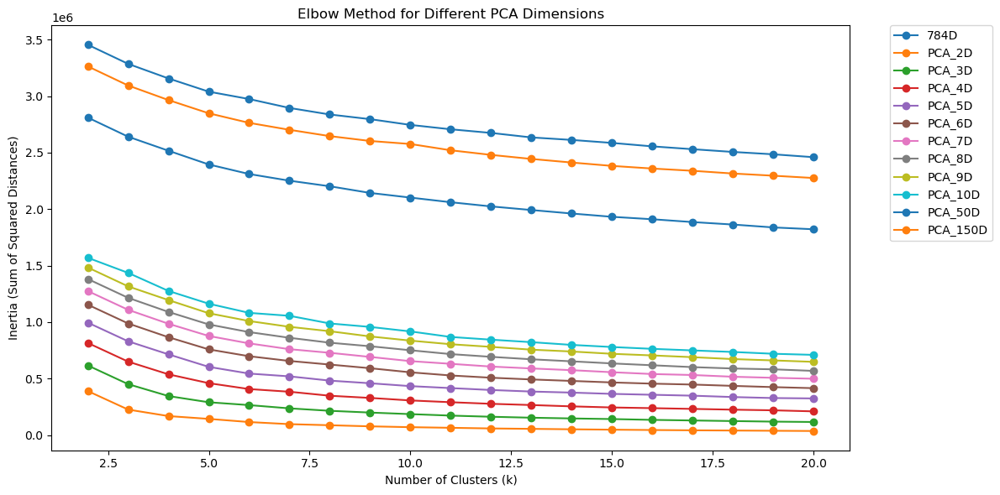

In [74]:
plt.figure(figsize=(12, 6))
for label, scores in inertia_results.items():
    plt.plot(k_values, scores, marker='o', label=label)

plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (Sum of Squared Distances)")
plt.title("Elbow Method for Different PCA Dimensions")

# Move legend outside
plt.legend(
    # position outside
    bbox_to_anchor=(1.05, 1),  
    # align to upper left of anchor
    loc='upper left',          
    borderaxespad=0.0
)

plt.tight_layout()
plt.show()

## Silhouette score vs number of clusters (k) plot for different PCA
1. Find the best k (number of clusters)
2. Compare performance across PCA dimensions
3. Visualize the effect of dimensionality reduction

In [24]:
def compute_silhouette_scores(X_data, k_range):
    scores = []
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
        labels = kmeans.fit_predict(X_data)
        score = silhouette_score(X_data, labels)
        scores.append(score)
    return scores

In [18]:
k_values = range(2, 21)

# Store results
silhouette_results = {}

# 0riginal data (784D) 
print("\nSilhouette: No PCA (784D)")
start_time = time.time()
silhouette_results["784D"] = compute_silhouette_scores(X, k_values)
print(f"Done in {time.time() - start_time:.2f} seconds")

# PCA with various dimensions
pca_dimensions = [2, 3, 4, 5, 6, 7, 8, 9, 10, 50, 150]

for dim in pca_dimensions:
    print(f"\nSilhouette: PCA {dim}D")
    start_time = time.time()
    pca = PCA(n_components=dim)
    X_pca = pca.fit_transform(X)
    silhouette_results[f"PCA_{dim}D"] = compute_silhouette_scores(X_pca, k_values)
    elapsed = time.time() - start_time
    print(f"Done in {elapsed:.2f} seconds")


Silhouette: No PCA (784D)
Done in 2603.79 seconds

Silhouette: PCA 2D
Done in 1338.24 seconds

Silhouette: PCA 3D
Done in 1233.02 seconds

Silhouette: PCA 4D
Done in 1235.34 seconds

Silhouette: PCA 5D
Done in 1276.81 seconds

Silhouette: PCA 6D
Done in 1232.81 seconds

Silhouette: PCA 7D
Done in 1241.78 seconds

Silhouette: PCA 8D
Done in 1245.66 seconds

Silhouette: PCA 9D
Done in 1341.66 seconds

Silhouette: PCA 10D
Done in 1237.41 seconds

Silhouette: PCA 50D
Done in 1403.67 seconds

Silhouette: PCA 150D
Done in 1514.25 seconds


In [22]:
silhouette_df = pd.DataFrame(silhouette_results, index=list(k_values))

file_path = "silhouette_results.csv"
silhouette_df.to_csv(file_path)
print(f"Saved to {file_path}")

Saved to silhouette_results.csv


In [19]:
silhouette_df = pd.read_csv("silhouette_results.csv")
silhouette_df.rename(columns={"Unnamed: 0": "k"}, inplace=True)

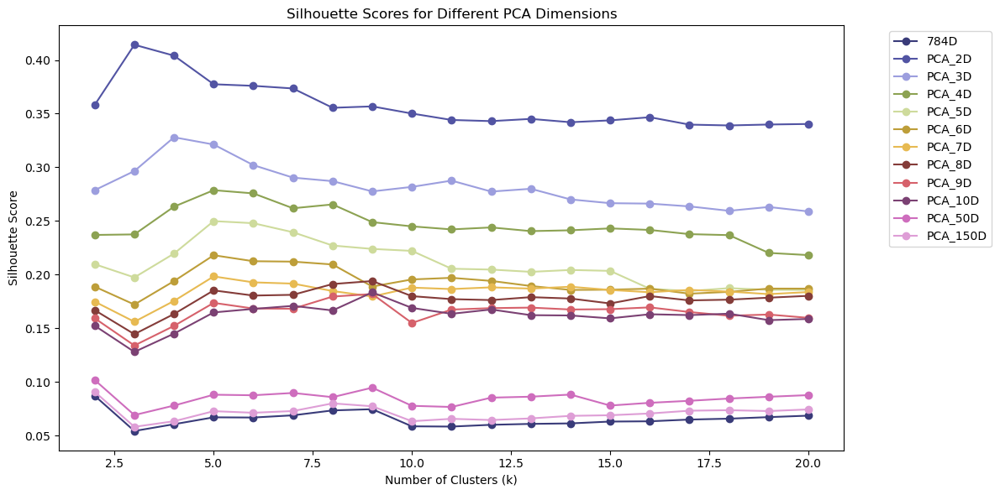

In [39]:
# Number of lines (excluding 'k' column)
n_lines = len(silhouette_df.columns) - 1

# Use a continuous colormap with n_lines distinct colors
colors = cm.tab20b(np.linspace(0, 1, n_lines)) 

plt.figure(figsize=(12, 6))

for i, col in enumerate(silhouette_df.columns[1:]):
    plt.plot(silhouette_df["k"], silhouette_df[col], marker="o", label=col, color=colors[i])

plt.title("Silhouette Scores for Different PCA Dimensions")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

In [24]:
summary_rows = []

for col in silhouette_df.columns[1:]:  # skip the 'k' column
    # Find k* (argmax silhouette)
    idx_max = silhouette_df[col].idxmax()
    k_star = int(silhouette_df.loc[idx_max, silhouette_df.columns[0]])
    sil_k_star = silhouette_df.loc[idx_max, col]

    # Get silhouette at k=10
    sil_k10 = silhouette_df.loc[silhouette_df[silhouette_df.columns[0]] == 10, col].values[0]

    # Calculate percentage drop
    delta_pct = ((sil_k10 - sil_k_star) / sil_k_star) * 100

    summary_rows.append({
        "PCA Dim": col,
        "k*": k_star,
        "Sil(k*)": round(sil_k_star, 6),
        "Sil(10)": round(sil_k10, 6),
        "Δ%": round(delta_pct, 1)
    })

summary_df = pd.DataFrame(summary_rows)

summary_df

,PCA Dim,k*,Sil(k*),Sil(10),Δ%
0,784D,2,0.087039,0.058590,-32.7
1,PCA_2D,3,0.414222,0.350121,-15.5
2,PCA_3D,4,0.327997,0.281757,-14.1
3,PCA_4D,5,0.278680,0.244959,-12.1
4,PCA_5D,5,0.249860,0.222118,-11.1
5,PCA_6D,5,0.218056,0.195490,-10.3
6,PCA_7D,5,0.198304,0.187887,-5.3
7,PCA_8D,9,0.194001,0.179920,-7.3
8,PCA_9D,9,0.181926,0.154889,-14.9
9,PCA_10D,9,0.183436,0.168960,-7.9


# Cumulative Explained Variance

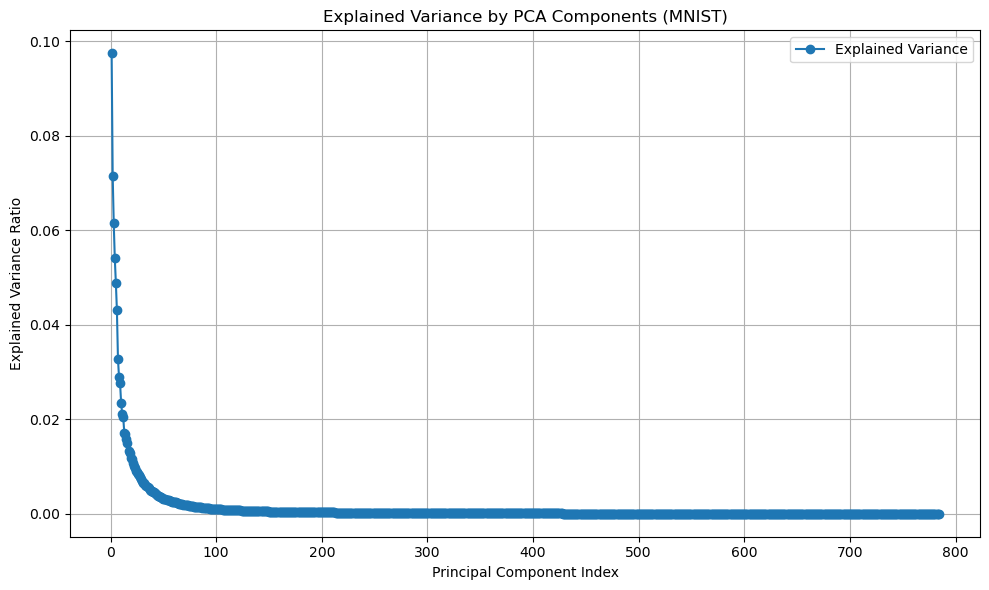

In [76]:
# plot explained variance for each PCA
pca = PCA(n_components=784)
pca.fit(X)
explained_var = pca.explained_variance_ratio_

# individual explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, 785), explained_var, marker='o', label='Explained Variance')

plt.xlabel('Principal Component Index')
plt.ylabel('Explained Variance Ratio')
plt.title("Explained Variance by PCA Components (MNIST)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

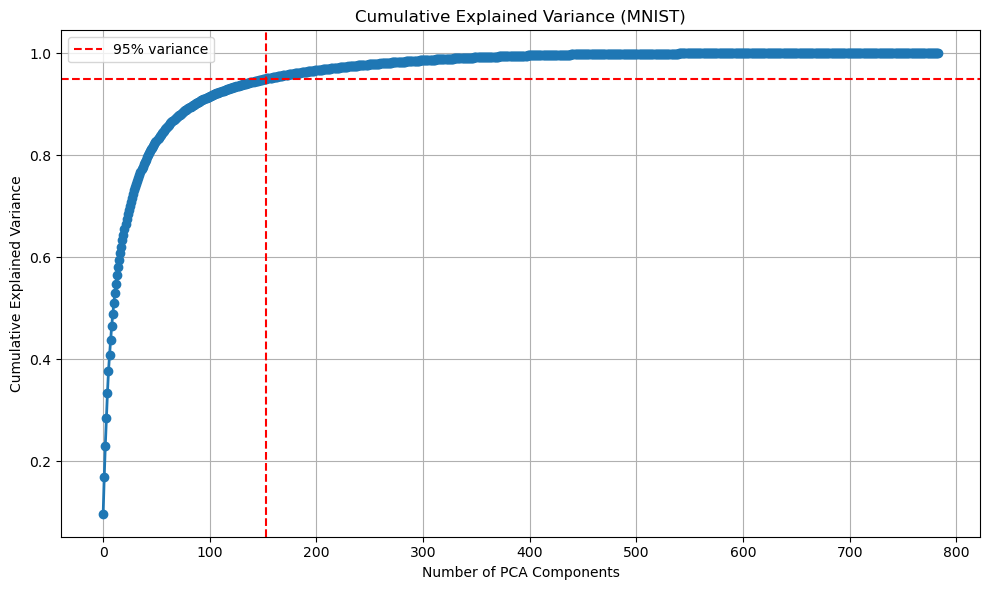

In [77]:
# plot cummulative explained varainece
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(explained_var), marker='o', linewidth=2)
plt.xlabel('Number of PCA Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance (MNIST)')
plt.grid(True)

# plot red line at 95% threshold
plt.axhline(y=0.95, color='r', linestyle='--', label='95% variance')
plt.axvline(x=np.argmax(np.cumsum(explained_var) >= 0.95), color='r', linestyle='--')
plt.legend()
plt.tight_layout()
plt.show()


In [17]:
def clustering_accuracy(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    row_ind, col_ind = linear_sum_assignment(-cm)
    return cm[row_ind, col_ind].sum() / np.sum(cm)

In [18]:
def evaluate_kmeans(X, y, n_clusters=10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(X)
    
    ari = adjusted_rand_score(y, labels)
    nmi = normalized_mutual_info_score(y, labels)
    sil = silhouette_score(X, labels)
    
    print(f"K-Means Results ({X.shape[1]}D):")
    print(f"ARI: {ari:.4f}")
    print(f"NMI: {nmi:.4f}")
    print(f"Silhouette Score: {sil:.4f}")
    
    return {
        "labels": labels,
        "ari": ari,
        "nmi": nmi,
        "silhouette": sil
    }


In [19]:
def plot_results(X_2d, y_true, cluster_labels, plot_scatter=True, plot_cm=True, title="Clustering on MNIST (Projected to 2D)"):
    # Visualise the cluster results
    if plot_scatter:
        plt.figure(figsize=(10, 6))
        plt.scatter(X_2d[:, 0], X_2d[:, 1], c=cluster_labels, cmap='tab10', s=1)
        plt.title(title)
        plt.xlabel("PCA 1")
        plt.ylabel("PCA 2")
        plt.colorbar(label="Cluster")
        plt.show()

    # Plot the confusion matrix
    if plot_cm:
        cm = confusion_matrix(y_true, cluster_labels)
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.xlabel("Cluster Label")
        plt.ylabel("True Digit Label")
        plt.title("Confusion Matrix: True Labels vs. Cluster Assignments")
        plt.show()

In [20]:
def show_cluster_examples(X, y_true, cluster_labels, cluster_id, num_images=25, cell_size=2, cols=10):
    idx = np.where(cluster_labels == cluster_id)[0]
    selected_idx = np.random.choice(idx, size=min(num_images, len(idx)), replace=False)
    
    rows = int(np.ceil(len(selected_idx) / cols))
    fig_width = cols * cell_size
    fig_height = rows * cell_size
    
    plt.figure(figsize=(fig_width, fig_height))
    
    for i, img_idx in enumerate(selected_idx):
        plt.subplot(rows, cols, i + 1)
        
        # Handle X being DataFrame or NumPy array
        if hasattr(X, "iloc"):  # Pandas DataFrame
            img_data = X.iloc[img_idx].values
        else:  # NumPy array
            img_data = X[img_idx]
        
        # Handle y_true being Series or NumPy array
        if hasattr(y_true, "iloc"):
            label = y_true.iloc[img_idx]
        else:
            label = y_true[img_idx]
        
        plt.imshow(img_data.reshape(28, 28), cmap='gray')
        plt.axis('off')
        plt.title(str(label), fontsize=10, pad=3)
    
    plt.suptitle(f"Examples from Cluster {cluster_id}", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()

In [196]:
# Run kmeans on full dimesnion data
# Clustering then PCA
kmeans_full_result = evaluate_kmeans(X, y)

K-Means Results (784D):
ARI: 0.3609
NMI: 0.4914
Silhouette Score: 0.0586


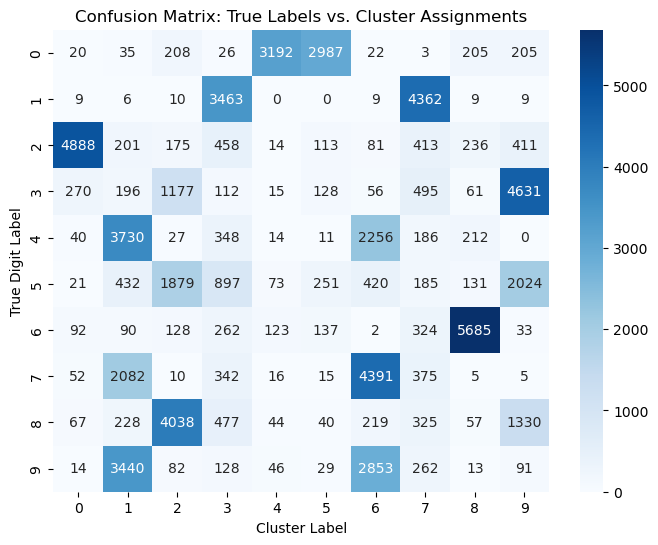

In [197]:
# PCA 2D for visualisation
pca_2d = PCA(n_components=2)
X_2d = pca_2d.fit_transform(X)  

plot_results(X_2d, y, kmeans_full_result['labels'], plot_scatter=False, plot_cm=True)

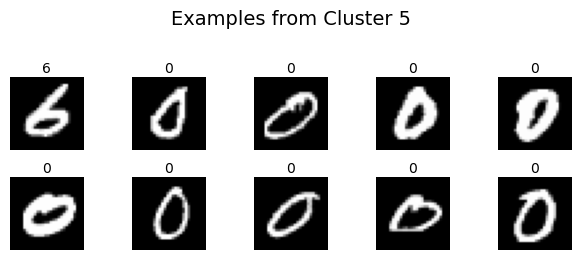

In [198]:
show_cluster_examples(X, y, kmeans_full_result['labels'], cluster_id=5, num_images=10, cell_size=1.25, cols=5)

In [199]:
# Standardized the data see whether any improvement
X_scaled = StandardScaler().fit_transform(X) 
kmeans_full_result = evaluate_kmeans(X_scaled, y)

K-Means Results (784D):
ARI: 0.3221
NMI: 0.4321
Silhouette Score: 0.0084


### PCA Before CLustering

In [200]:
# Kmeans on PCA2D data
pca_2d = PCA(n_components=2)
X_2d = pca_2d.fit_transform(X) 
print("Shape after PCA:", X_2d.shape)
kmeans_2d_result = evaluate_kmeans(X_2d, y)

Shape after PCA: (70000, 2)
K-Means Results (2D):
ARI: 0.2358
NMI: 0.3564
Silhouette Score: 0.3529


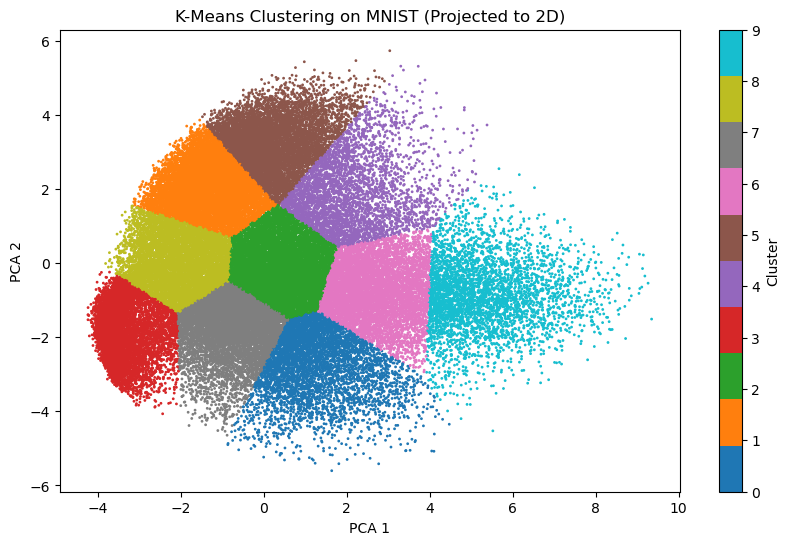

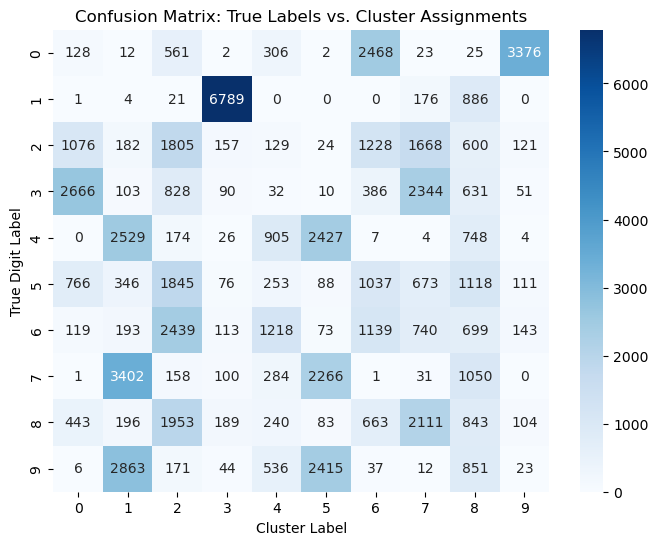

In [201]:
# PCA 2D for visualisation
X_2d = pca_2d.fit_transform(X)  

plot_results(X_2d, y, kmeans_2d_result['labels'], plot_scatter=True, plot_cm=True)

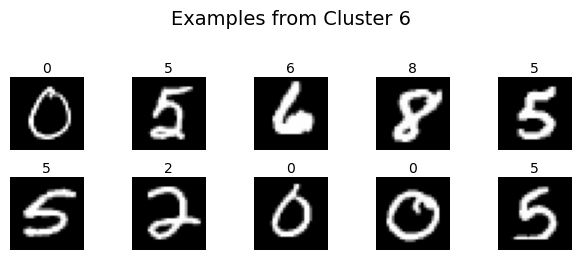

In [202]:
show_cluster_examples(X, y, kmeans_2d_result['labels'], cluster_id=6, num_images=10, cell_size=1.25, cols=5)

In [203]:
# Kmeans on PCA3D data
pca_3d = PCA(n_components=3)
X_3d = pca_3d.fit_transform(X) 
print("Shape after PCA:", X_3d.shape)
kmeans_3d_result = evaluate_kmeans(X_3d, y)

Shape after PCA: (70000, 3)
K-Means Results (3D):
ARI: 0.2413
NMI: 0.3481
Silhouette Score: 0.2818


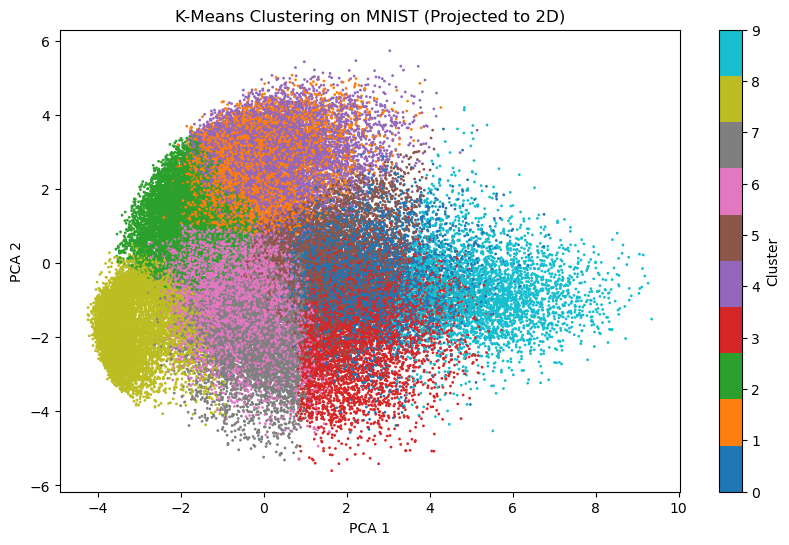

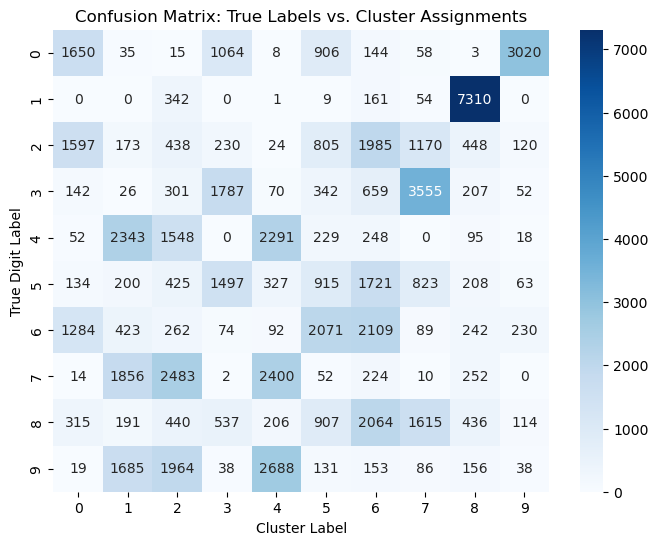

In [204]:
# PCA 2D for visualisation
X_2d_from_3d = pca_2d.fit_transform(X_3d)  

plot_results(X_2d_from_3d, y, kmeans_3d_result['labels'], plot_scatter=True, plot_cm=True)

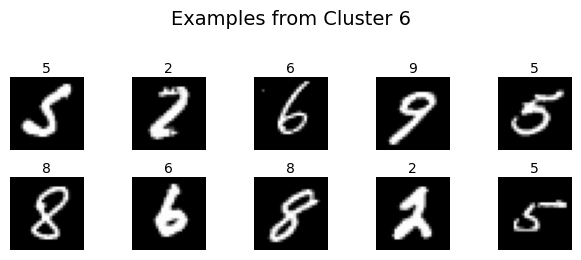

In [205]:
show_cluster_examples(X, y, kmeans_3d_result['labels'], cluster_id=6, num_images=10, cell_size=1.25, cols=5)

In [206]:
# Kmeans on PCA10D data
pca_10d = PCA(n_components=10)
X_10d = pca_10d.fit_transform(X) 
print("Shape after PCA:", X_10d.shape)
kmeans_10d_result = evaluate_kmeans(X_10d, y)

Shape after PCA: (70000, 10)
K-Means Results (10D):
ARI: 0.3929
NMI: 0.5014
Silhouette Score: 0.1784


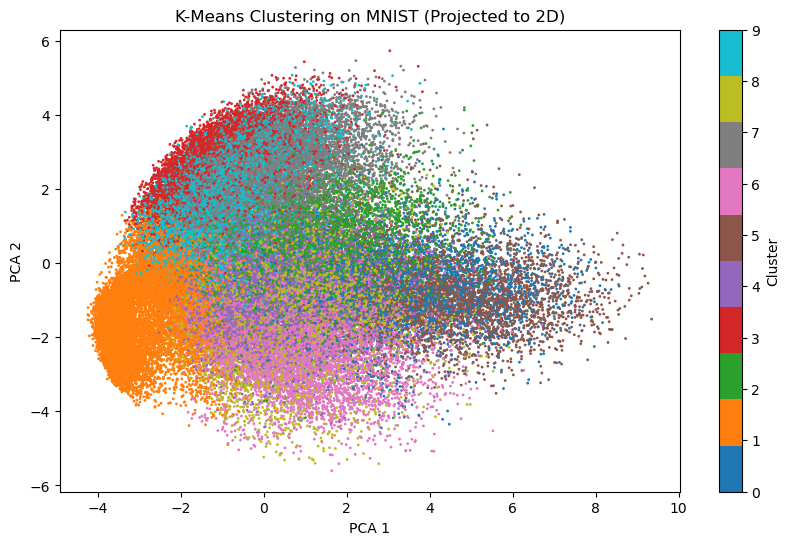

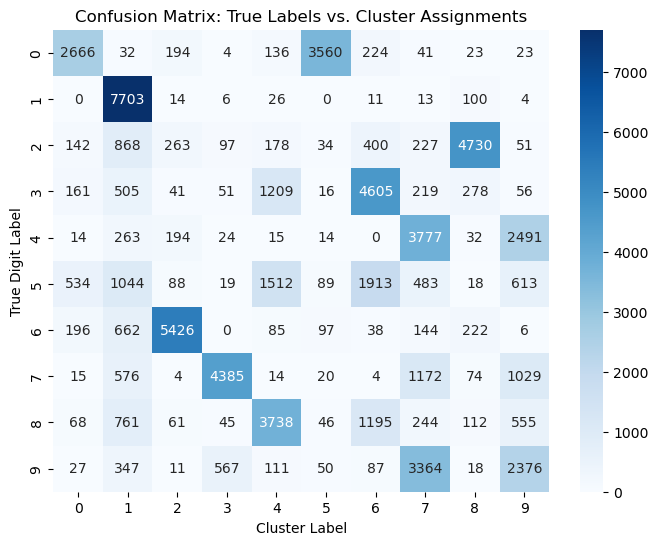

In [207]:
# PCA 2D for visualisation
X_2d_from_10d = pca_2d.fit_transform(X_10d)  

plot_results(X_2d_from_10d, y, kmeans_10d_result['labels'], plot_scatter=True, plot_cm=True)

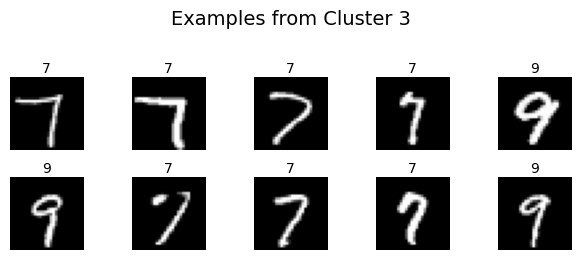

In [208]:
show_cluster_examples(X, y, kmeans_10d_result['labels'], cluster_id=3, num_images=10, cell_size=1.25, cols=5)

In [209]:
# Kmeans on PCA50D data
pca_50d = PCA(n_components=50)
X_50d = pca_50d.fit_transform(X) 
print("Shape after PCA:", X_50d.shape)
kmeans_50d_result = evaluate_kmeans(X_50d, y)

Shape after PCA: (70000, 50)
K-Means Results (50D):
ARI: 0.3624
NMI: 0.4827
Silhouette Score: 0.0820


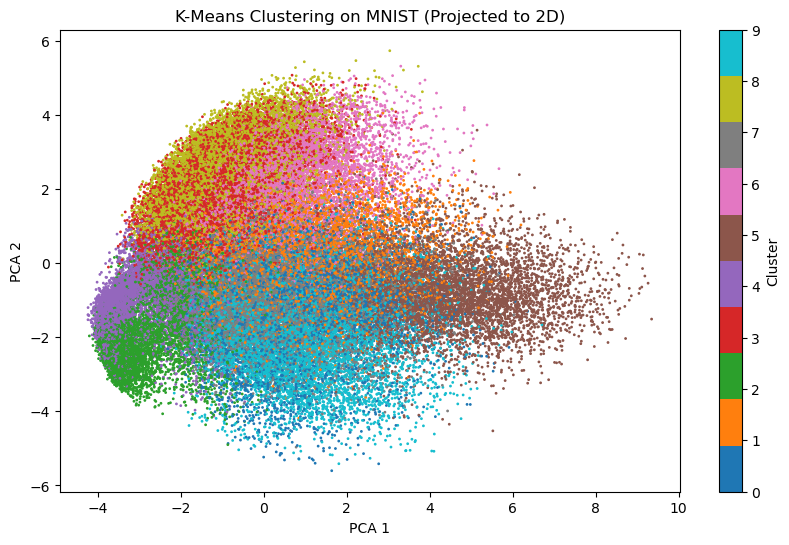

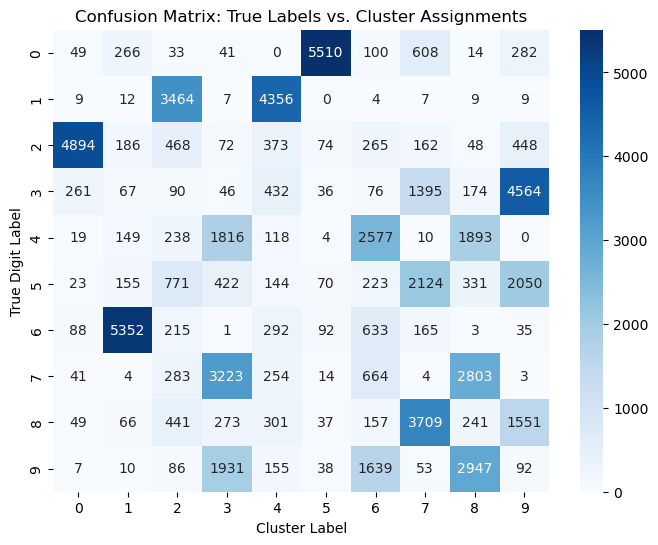

In [210]:
# PCA 2D for visualisation
X_2d_from_50d = pca_2d.fit_transform(X_50d)  

plot_results(X_2d_from_50d, y, kmeans_50d_result['labels'], plot_scatter=True, plot_cm=True)

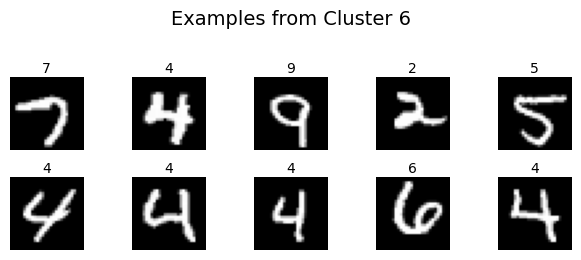

In [211]:
show_cluster_examples(X, y, kmeans_50d_result['labels'], cluster_id=6, num_images=10, cell_size=1.25, cols=5)

In [214]:
# Kmeans on PCA150D data
pca_150d = PCA(n_components=150)
X_150d = pca_150d.fit_transform(X) 
print("Shape after PCA:", X_150d.shape)
kmeans_150d_result = evaluate_kmeans(X_150d, y)

Shape after PCA: (70000, 150)
K-Means Results (150D):
ARI: 0.3666
NMI: 0.4998
Silhouette Score: 0.0662


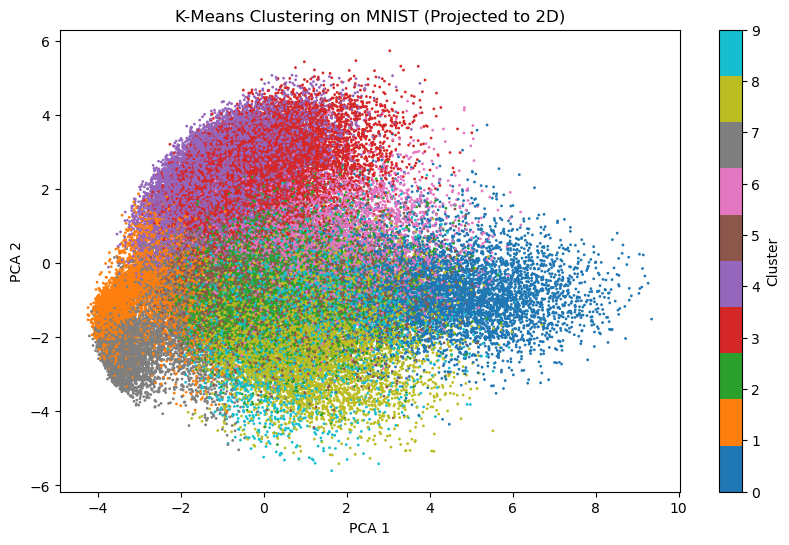

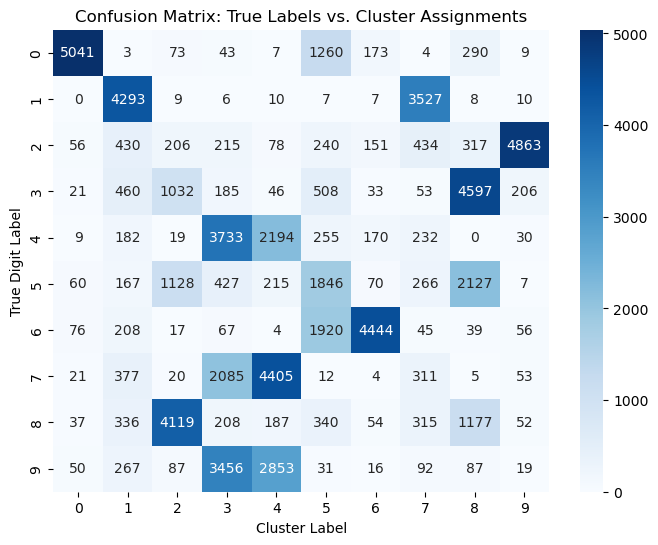

In [215]:
# PCA 2D for visualisation
X_2d_from_150d = pca_2d.fit_transform(X_150d)  

plot_results(X_2d_from_150d, y, kmeans_150d_result['labels'], plot_scatter=True, plot_cm=True)

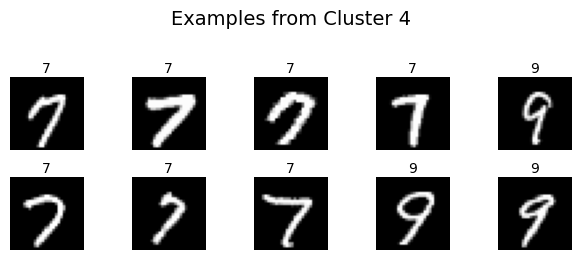

In [216]:
show_cluster_examples(X, y, kmeans_150d_result['labels'], cluster_id=45, num_images=10, cell_size=1.25, cols=5)

In [180]:
# Store results
ari_results = {}
nmi_results = {}
sil_results = {}
acc_results = {}

# PCA with various dimensions
pca_dimensions = [2, 3, 4, 5, 6, 7, 8, 9, 10, 50, 150]

for dim in pca_dimensions:
    pca = PCA(n_components=dim)
    X_pca = pca.fit_transform(X)
    
    kmeans = KMeans(n_clusters=10, random_state=42, n_init='auto')
    clusters_pca = kmeans.fit_predict(X_pca)
    
    ari_results[f"{dim}D"] = adjusted_rand_score(y, clusters_pca)
    nmi_results[f"{dim}D"] = normalized_mutual_info_score(y, clusters_pca)
    sil_results[f"{dim}D"] = silhouette_score(X_pca, clusters_pca)
    acc_results[f"{dim}D"] = clustering_accuracy(y, clusters_pca)

# Full data (784D)
kmeans = KMeans(n_clusters=10, random_state=42, n_init='auto')
clusters_full = kmeans.fit_predict(X)
ari_results["784D"] = adjusted_rand_score(y, clusters_full)
nmi_results["784D"] = normalized_mutual_info_score(y, clusters_full)
sil_results["784D"] = silhouette_score(X, clusters_full)
acc_results["784D"] = clustering_accuracy(y, clusters_full)

In [218]:
# Combine all results into a DataFrame
k_means_hw_results_df = pd.DataFrame({
    "PCA_Dimension": list(ari_results.keys()),
    "ARI": list(ari_results.values()),
    "NMI": list(nmi_results.values()),
    "Silhouette": list(sil_results.values()),
    "Accuracy": list(acc_results.values())
})

# Save to CSV
results_path = "k_means_external_results.csv"
k_means_hw_results_df.to_csv(results_path, index=False)

print(f"Results saved to {results_path}")

Results saved to k_means_external_results.csv


In [219]:
k_means_hw_results_df

,PCA_Dimension,ARI,NMI,Silhouette,Accuracy
0,2D,0.248387,0.362322,0.350906,0.396857
1,3D,0.241288,0.348153,0.281758,0.408986
2,4D,0.285406,0.397693,0.244957,0.443357
3,5D,0.300333,0.421705,0.222126,0.443214
4,6D,0.286879,0.428645,0.195185,0.446100
5,7D,0.330350,0.452462,0.187891,0.498029
6,8D,0.401422,0.502364,0.190900,0.594271
7,9D,0.405537,0.508088,0.180158,0.598771
8,10D,0.392880,0.501464,0.178380,0.583371
9,50D,0.360581,0.490163,0.085006,0.512729


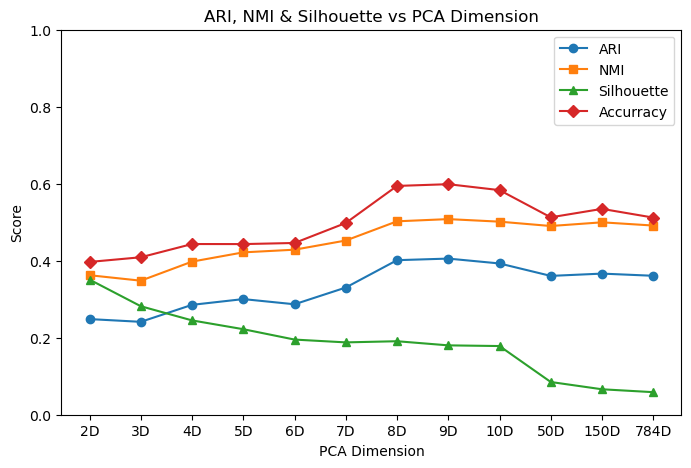

In [222]:
dims = list(ari_results.keys())
ari_values = list(ari_results.values())
nmi_values = list(nmi_results.values())
sil_values = list(sil_results.values())
acc_values = list(acc_results.values())

plt.figure(figsize=(8, 5))
plt.plot(dims, ari_values, marker='o', label="ARI")
plt.plot(dims, nmi_values, marker='s', label="NMI")
plt.plot(dims, sil_values, marker='^', label="Silhouette")
plt.plot(dims, acc_values, marker='D', label="Accurracy")
plt.title("ARI, NMI & Silhouette vs PCA Dimension")
plt.xlabel("PCA Dimension")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.legend()
plt.show()

# DBSCAN

Is big or small eps better?

Too small: Almost every point is an outlier (cluster = noise), few or zero clusters formed.

Too large: Merges everything into one big cluster, lose useful separation.

In [74]:
def plot_k_distance_graph(X, k, title_prefix=""):
    nn = NearestNeighbors(n_neighbors=k)
    nn.fit(X)
    distances, _ = nn.kneighbors(X)
    k_distances_sorted = np.sort(distances[:, k - 1])

    plt.figure(figsize=(10, 6))
    plt.plot(k_distances_sorted)
    plt.xlabel("Data Points (sorted)")
    plt.ylabel(f"Distance to {k}-th Nearest Neighbor")
    plt.title(f"K-Distance Graph ({title_prefix}, k={k})")
    plt.grid(True)
    plt.show()

In [75]:
def evaluate_dbscan(X, y=None, eps=0.5, min_samples=5):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(X)

    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    noise_points = int(np.sum(labels == -1))
    noise_pct = 100.0 * noise_points / len(labels)

    results = {
        "eps": eps,
        "min_samples": min_samples,
        "n_clusters": n_clusters,
        "noise_points": noise_points,
        "noise_pct": noise_pct,
        "labels": labels
    }

    if y is not None:
        results["ARI"] = adjusted_rand_score(y, labels)
        results["NMI"] = normalized_mutual_info_score(y, labels)

    # Silhouette score (only for non-noise points with ≥2 clusters)
    mask = labels != -1
    if mask.any() and len(set(labels[mask])) >= 2:
        results["silhouette"] = silhouette_score(X[mask], labels[mask])
    else:
        results["silhouette"] = None

    # prints
    print(f"DBSCAN Results ({X.shape[1]}D):")
    print(f"Clusters found: {n_clusters}")
    print(f"Noise points: {noise_points} ({noise_pct:.2f}%)")
    if y is not None:
        print(f"ARI: {results['ARI']:.4f}")
        print(f"NMI: {results['NMI']:.4f}")
    if results["silhouette"] is not None:
        print(f"Silhouette (non-noise): {results['silhouette']:.4f}")
    else:
        print("Silhouette (non-noise): N/A")

    return results

In [55]:
X_scaled = StandardScaler().fit_transform(X)

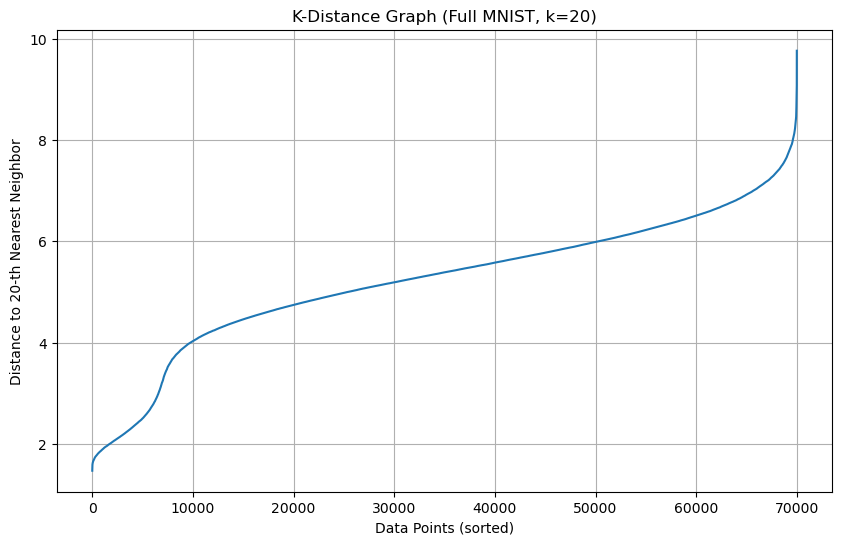

In [17]:
full_k20 = plot_k_distance_graph(X, k=20, title_prefix="Full MNIST")

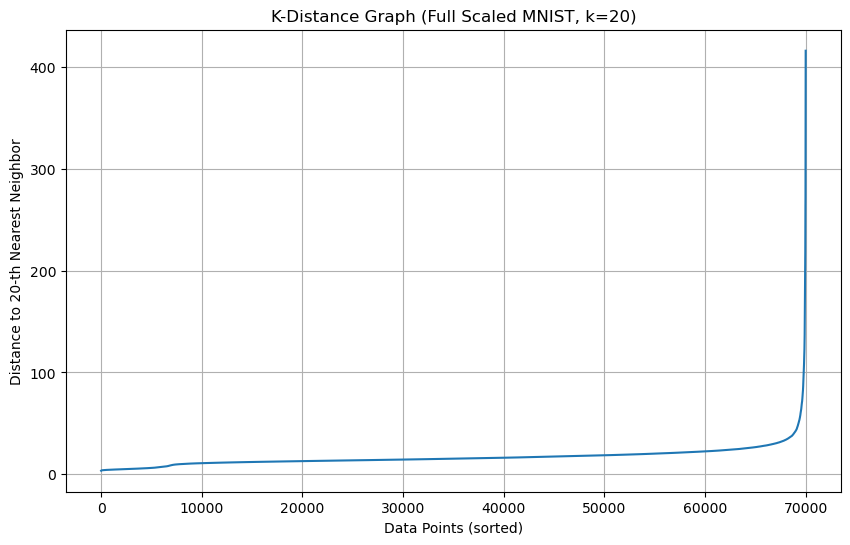

In [18]:
full_scaled_k20 = plot_k_distance_graph(X_scaled, k=20, title_prefix="Full Scaled MNIST")

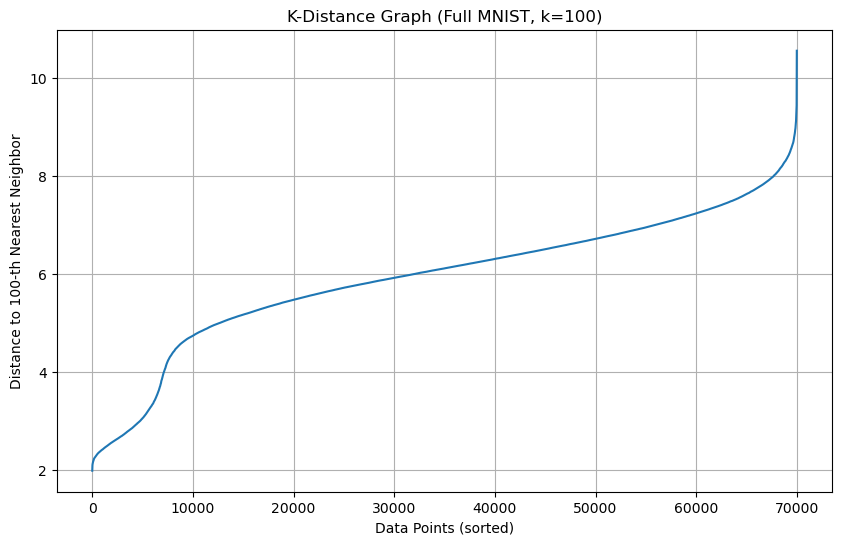

In [19]:
full_k100 = plot_k_distance_graph(X, k=100, title_prefix="Full MNIST")

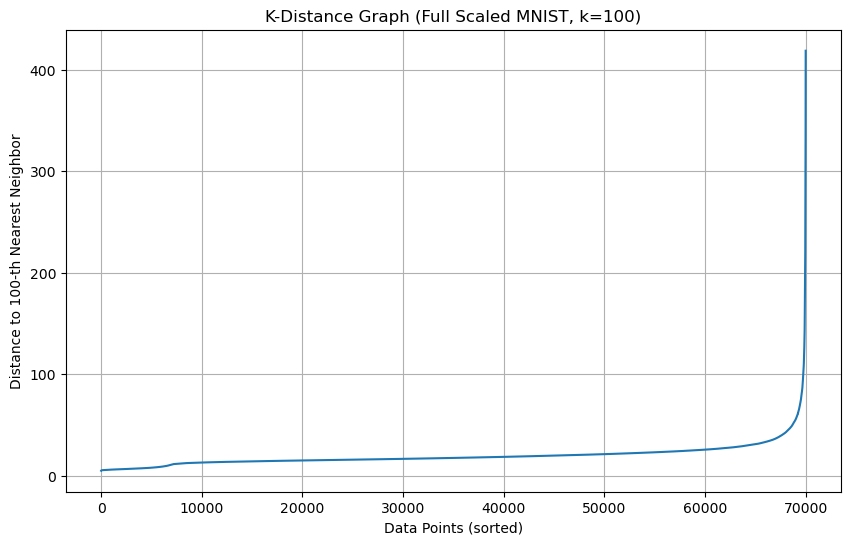

In [20]:
full_scaled_k100 = plot_k_distance_graph(X_scaled, k=100, title_prefix="Full Scaled MNIST")

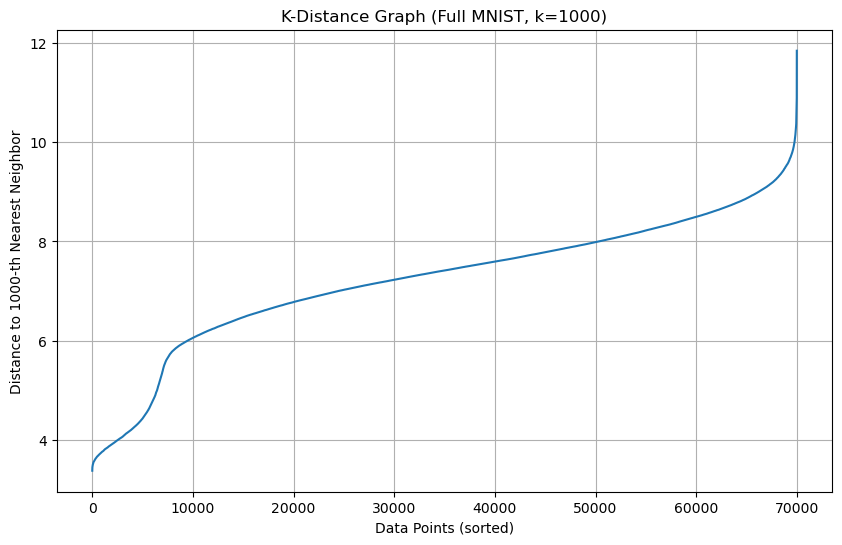

In [21]:
full_k1000 = plot_k_distance_graph(X, k=1000, title_prefix="Full MNIST")

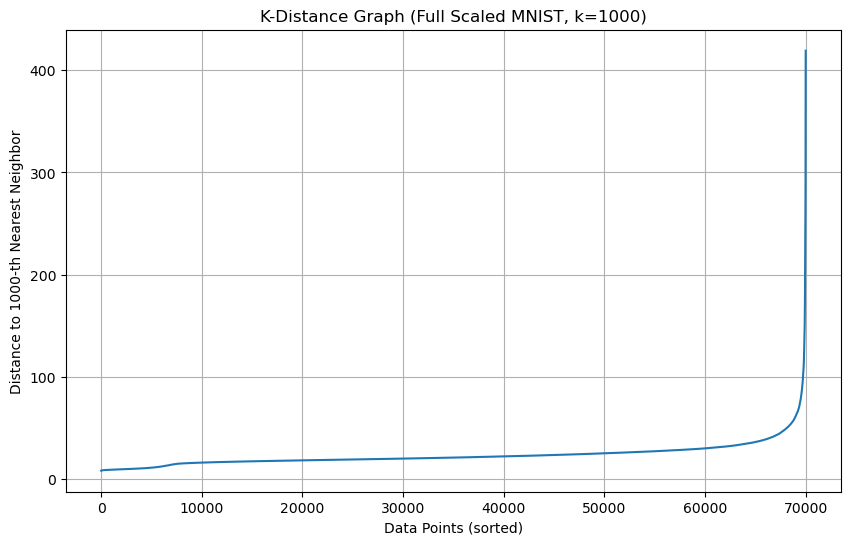

In [22]:
full_scaled_k1000 = plot_k_distance_graph(X_scaled, k=1000, title_prefix="Full Scaled MNIST")

In [90]:
# evaluate on full data with eps=5 and min_sample=20
dbscan_full = evaluate_dbscan(X, y, eps=5, min_samples=20)

DBSCAN Results (784D):
Clusters found: 3
Noise points: 30721 (43.89%)
ARI: 0.0676
NMI: 0.1302
Silhouette (non-noise): 0.0128


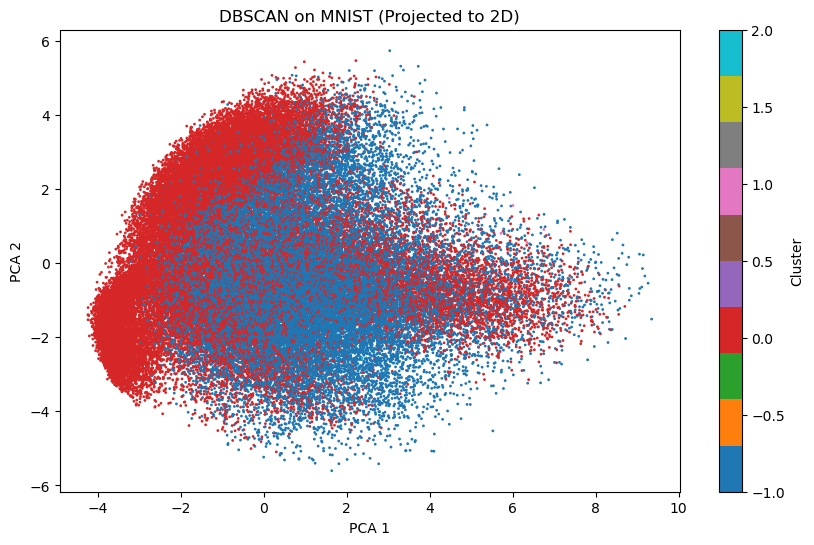

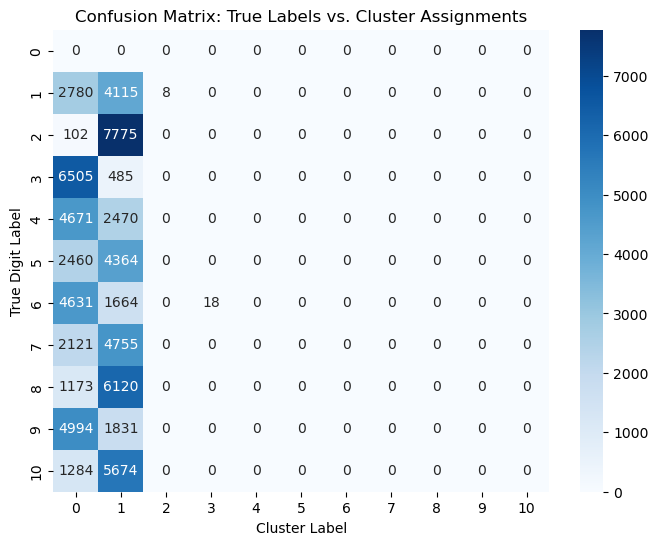

In [92]:
# PCA 2D for visualisation
pca_2d = PCA(n_components=2)
X_2d = pca_2d.fit_transform(X)  

plot_results(X_2d, y, dbscan_full["labels"], title="DBSCAN on MNIST (Projected to 2D)")

In [91]:
# evaluate on scaled data with eps=5 and min_sample=20
dbscan_full_scaled = evaluate_dbscan(X_scaled, y, eps=15, min_samples=20)

DBSCAN Results (784D):
Clusters found: 3
Noise points: 27247 (38.92%)
ARI: 0.0370
NMI: 0.0746
Silhouette (non-noise): 0.2871


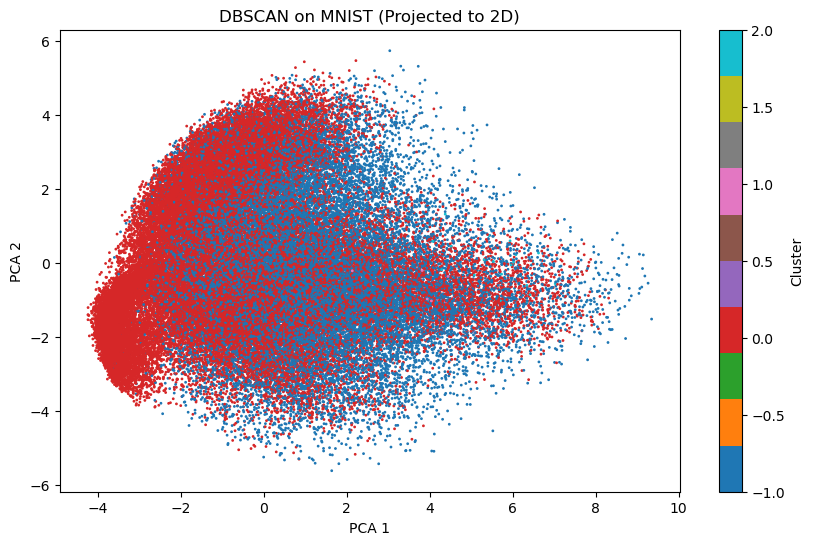

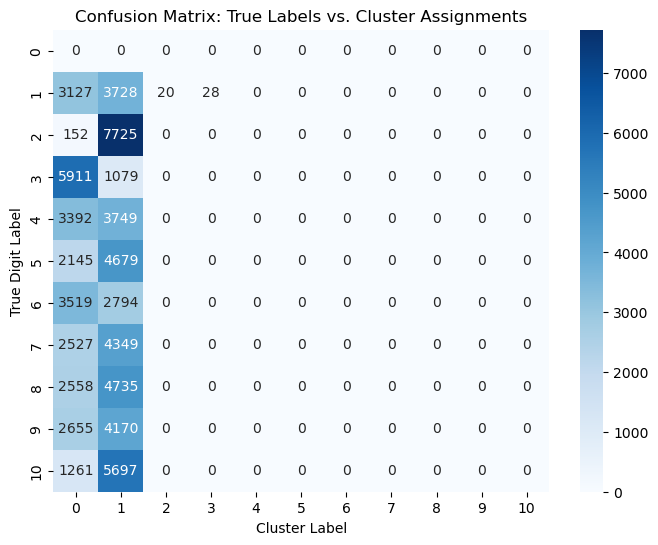

In [93]:
# PCA 2D for visualisation
pca_2d = PCA(n_components=2)
X_2d = pca_2d.fit_transform(X)  

plot_results(X_2d, y, dbscan_full_scaled["labels"], title="DBSCAN on MNIST (Projected to 2D)")

In [94]:
# Define parameter ranges
eps_values = [5, 10, 15, 20, 25]
min_samples_values = [5, 10, 20, 50, 100]

# Store results
dbscan_full_results = []

for eps in eps_values:
    for ms in min_samples_values:
        print(f"Running DBSCAN with eps={eps}, min_samples={ms}")
        res = evaluate_dbscan(X_scaled, y, eps=eps, min_samples=ms)
        
        # Assuming evaluate_dbscan prints results and returns metrics in a dict
        dbscan_full_results.append({
            'eps': eps,
            'min_samples': ms,
            'n_clusters': res['n_clusters'],     
            'noise_points': res['noise_points'],
            'noise_pct': res['noise_pct'],       
            'ARI': res.get('ARI', None),         
            'NMI': res.get('NMI', None), 
            'silhouette': res.get('silhouette', None)
        })

dbscan_full_results_df = pd.DataFrame(dbscan_full_results)

Running DBSCAN with eps=5, min_samples=5
DBSCAN Results (784D):
Clusters found: 10
Noise points: 64855 (92.65%)
ARI: 0.0198
NMI: 0.1479
Silhouette (non-noise): -0.1612
Running DBSCAN with eps=5, min_samples=10
DBSCAN Results (784D):
Clusters found: 4
Noise points: 65289 (93.27%)
ARI: 0.0162
NMI: 0.1339
Silhouette (non-noise): -0.1170
Running DBSCAN with eps=5, min_samples=20
DBSCAN Results (784D):
Clusters found: 1
Noise points: 66037 (94.34%)
ARI: 0.0108
NMI: 0.1108
Silhouette (non-noise): N/A
Running DBSCAN with eps=5, min_samples=50
DBSCAN Results (784D):
Clusters found: 2
Noise points: 67650 (96.64%)
ARI: 0.0028
NMI: 0.0639
Silhouette (non-noise): 0.1904
Running DBSCAN with eps=5, min_samples=100
DBSCAN Results (784D):
Clusters found: 1
Noise points: 69676 (99.54%)
ARI: -0.0002
NMI: 0.0088
Silhouette (non-noise): N/A
Running DBSCAN with eps=10, min_samples=5
DBSCAN Results (784D):
Clusters found: 104
Noise points: 54409 (77.73%)
ARI: 0.0558
NMI: 0.2174
Silhouette (non-noise): -0.14

In [96]:
# Save DBSCAN results to CSV
results_path = "dbscan_full_results.csv"
dbscan_full_results_df.to_csv(results_path, index=False)

print(f"DBSCAN full results saved to '{results_path}'")

DBSCAN full results saved to 'dbscan_full_results.csv'


## DBSCAN on PCA2 

In [97]:
# PCA 2D on the data
pca_2d = PCA(n_components=2)
X_2d = pca_2d.fit_transform(X)
X_2d_scaled = pca_2d.fit_transform(X_scaled)

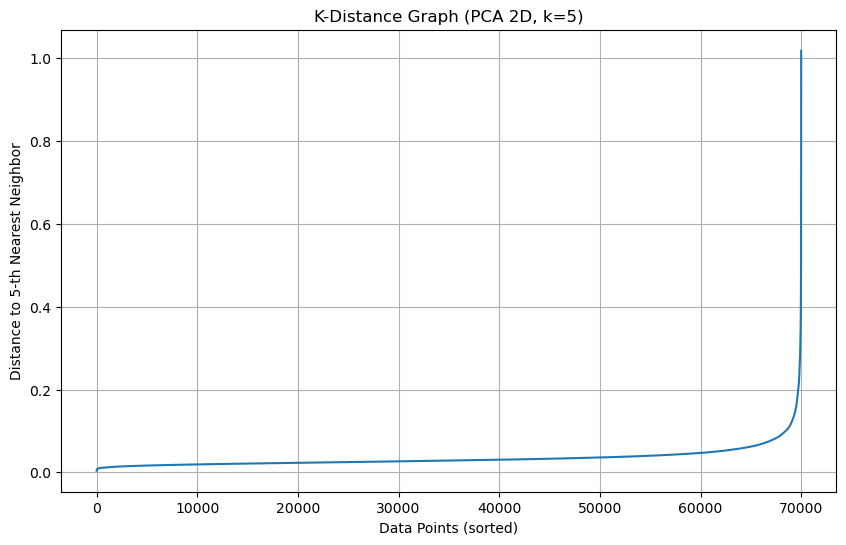

In [98]:
pca2_k4 = plot_k_distance_graph(X_2d, k=5, title_prefix="PCA 2D")

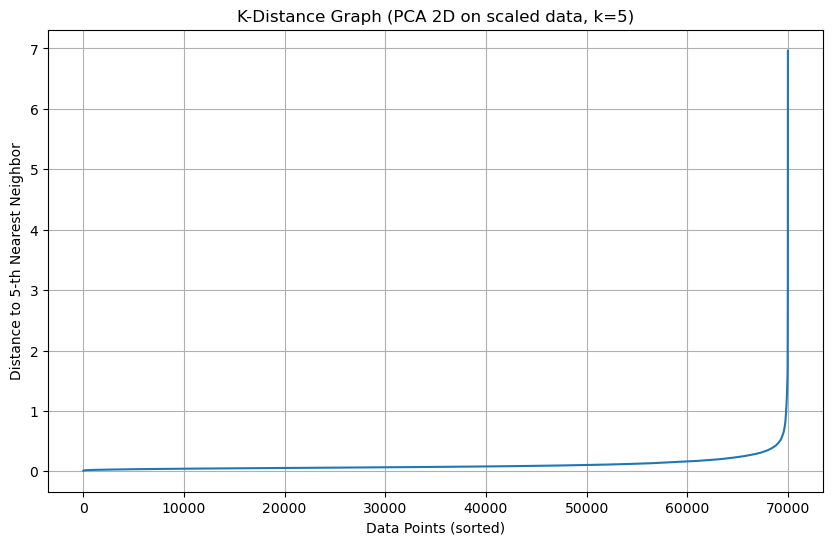

In [99]:
scaled_pca2_k4 = plot_k_distance_graph(X_2d_scaled, k=5, title_prefix="PCA 2D on scaled data")

In [100]:
dbscan_pca2_full = evaluate_dbscan(X_2d, y, eps=0.19, min_samples=5)

DBSCAN Results (2D):
Clusters found: 10
Noise points: 202 (0.29%)
ARI: 0.0000
NMI: 0.0028
Silhouette (non-noise): 0.0713


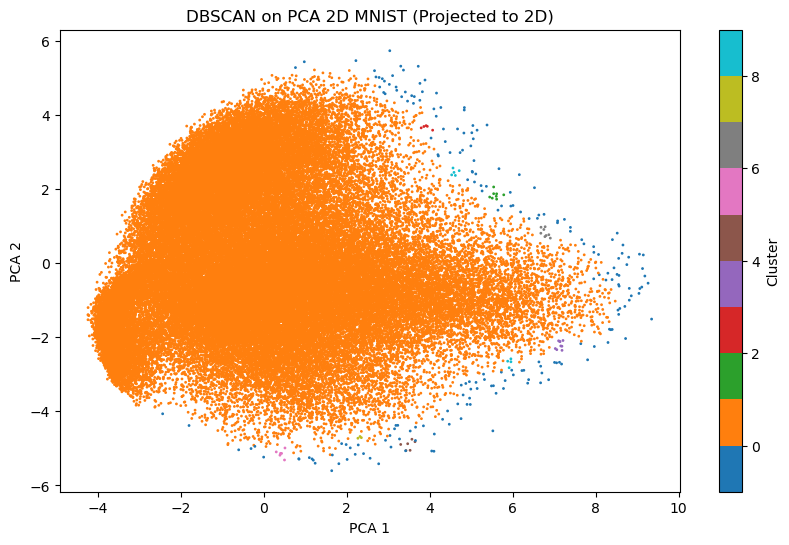

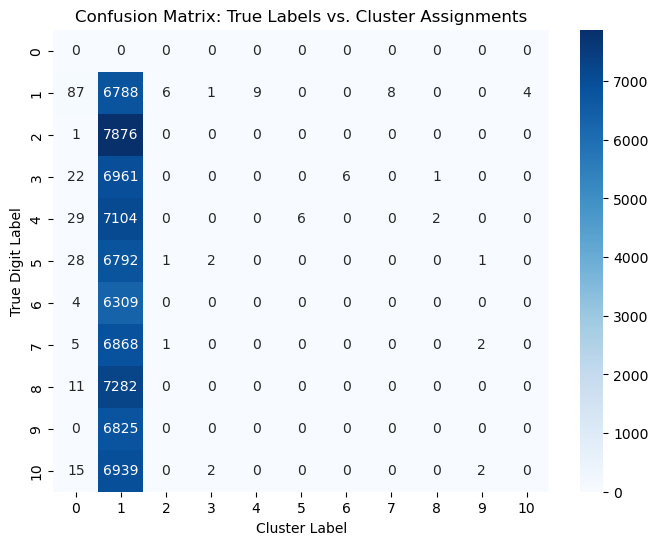

In [101]:
plot_results(X_2d, y, dbscan_pca2_full["labels"], title="DBSCAN on PCA 2D MNIST (Projected to 2D)")

In [102]:
dbscan_pca2_full_scaled = evaluate_dbscan(X_2d_scaled, y, eps=0.9, min_samples=5)

DBSCAN Results (2D):
Clusters found: 7
Noise points: 149 (0.21%)
ARI: 0.0000
NMI: 0.0028
Silhouette (non-noise): 0.4811


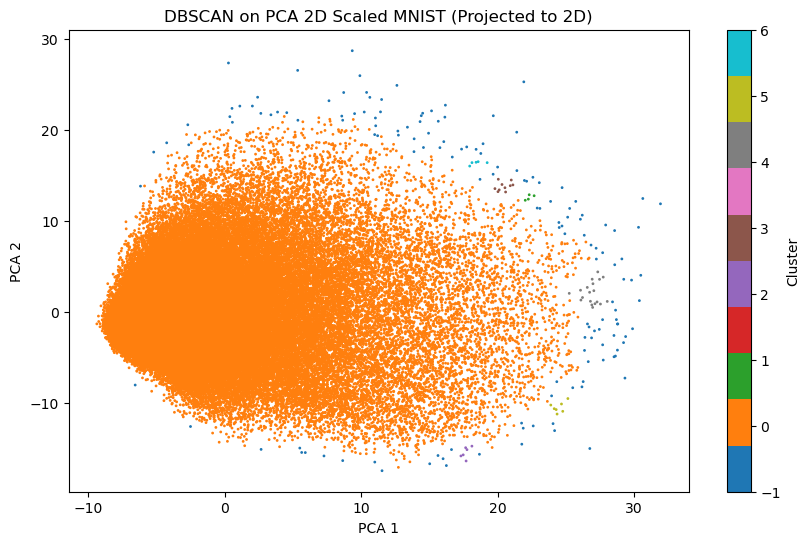

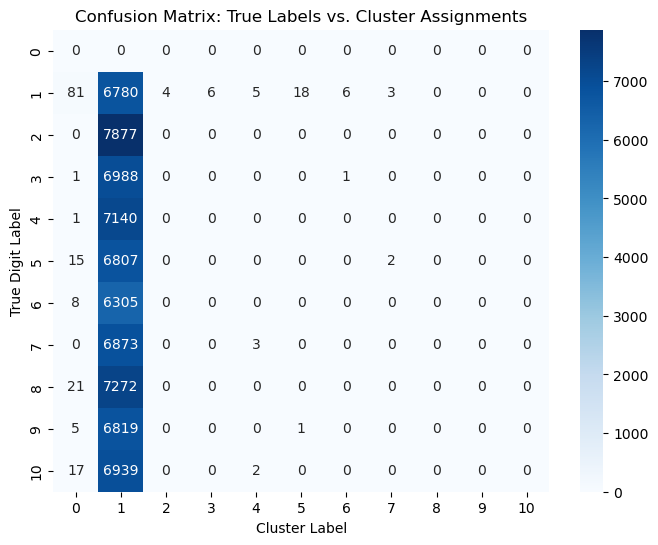

In [104]:
plot_results(X_2d_scaled, y, dbscan_pca2_full_scaled["labels"], title="DBSCAN on PCA 2D Scaled MNIST (Projected to 2D)")

In [83]:
def suggest_eps(X2d, k):
    nn = NearestNeighbors(n_neighbors=k).fit(X2d)
    dists, _ = nn.kneighbors(X2d)
    kd = np.sort(dists[:, -1])  # k-distance
    # simple heuristics
    return {
        "median_kdist": float(np.median(kd)),
        "p80_kdist": float(np.percentile(kd, 80)),
        "p90_kdist": float(np.percentile(kd, 90))
    }

suggest_eps(X_2d, k=5)

{'median_kdist': 0.028505032616473074,
 'p80_kdist': 0.04127331634123048,
 'p90_kdist': 0.05426773661356193}

In [76]:
eps_values = np.arange(0.028, 0.101, 0.012)  # 0.028, 0.04, 0.052, 0.064, 0.076, 0.088, 0.1
min_samples_values = [3, 5, 8, 10, 12]

dbscan_pca2_results = []

for eps in eps_values:
    for ms in min_samples_values:
        print(f"Running DBSCAN with eps={eps}, min_samples={ms}")
        res = evaluate_dbscan(X_2d, y, eps=eps, min_samples=ms)
        dbscan_pca2_results.append({
            'eps': eps, 
            'min_samples': ms,
            'n_clusters': res['n_clusters'],
            'noise_points': res['noise_points'],
            'noise_pct': res['noise_pct'],
            'ARI': res.get('ARI', None),         
            'NMI': res.get('NMI', None),
            'silhouette': res.get('silhouette', None)
        })
        
dbscan_pca2_results_df = pd.DataFrame(dbscan_pca2_results)

Running DBSCAN with eps=0.028, min_samples=3
DBSCAN Results (2D):
Clusters found: 3199
Noise points: 11452 (16.36%)
ARI: 0.1447
NMI: 0.2567
Silhouette (non-noise): -0.3087
Running DBSCAN with eps=0.028, min_samples=5
DBSCAN Results (2D):
Clusters found: 2177
Noise points: 23767 (33.95%)
ARI: 0.0731
NMI: 0.2136
Silhouette (non-noise): -0.1198
Running DBSCAN with eps=0.028, min_samples=8
DBSCAN Results (2D):
Clusters found: 1294
Noise points: 46283 (66.12%)
ARI: 0.0135
NMI: 0.1599
Silhouette (non-noise): 0.2501
Running DBSCAN with eps=0.028, min_samples=10
DBSCAN Results (2D):
Clusters found: 617
Noise points: 58089 (82.98%)
ARI: 0.0026
NMI: 0.1216
Silhouette (non-noise): 0.3680
Running DBSCAN with eps=0.028, min_samples=12
DBSCAN Results (2D):
Clusters found: 233
Noise points: 64877 (92.68%)
ARI: 0.0005
NMI: 0.0804
Silhouette (non-noise): 0.4411
Running DBSCAN with eps=0.04, min_samples=3
DBSCAN Results (2D):
Clusters found: 1173
Noise points: 4767 (6.81%)
ARI: 0.0082
NMI: 0.1184
Silhou

In [78]:
# Save DBSCAN results to CSV
results_path = "dbscan_pca2_results.csv"
dbscan_pca2_results_df.to_csv(results_path, index=False)

print(f"DBSCAN full results saved to '{results_path}'")

DBSCAN full results saved to 'dbscan_pca2_results.csv'


## DBSCAN on PCA50

In [80]:
# PCA 50D on the data
pca_50d = PCA(n_components=50)
X_50d = pca_50d.fit_transform(X)
X_50d_scaled = pca_50d.fit_transform(X_scaled)

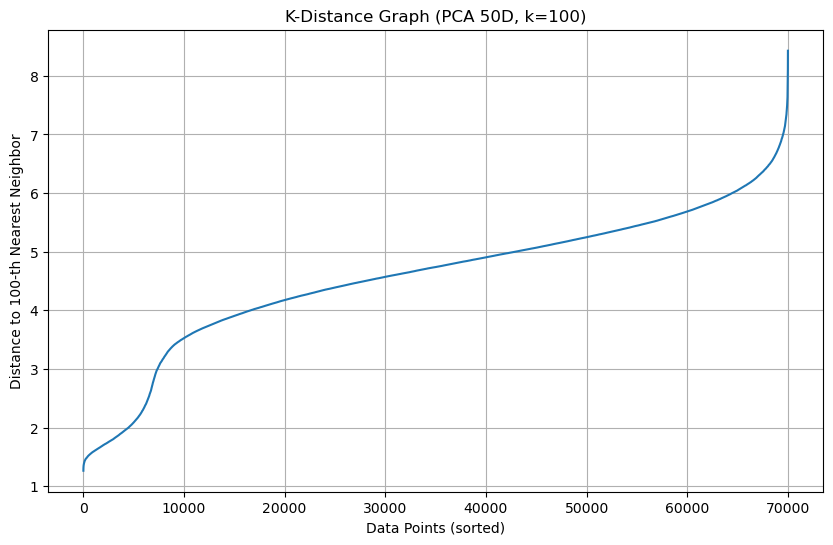

In [81]:
pca50_k100 = plot_k_distance_graph(X_50d, k=100, title_prefix="PCA 50D")

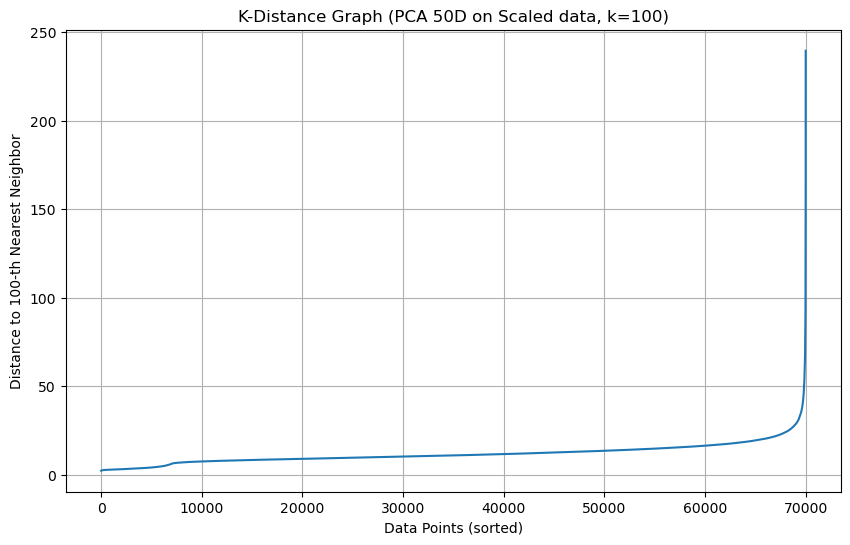

In [83]:
scaled_pca50_k100 = plot_k_distance_graph(X_50d_scaled, k=100, title_prefix="PCA 50D on Scaled data")

In [101]:
dbscan_pca50_full = evaluate_dbscan(X_50d, y, eps=3, min_samples=100)

DBSCAN Results (50D):
Clusters found: 2
Noise points: 60483 (86.40%)
ARI: 0.0537
NMI: 0.2720
Silhouette (non-noise): 0.3131


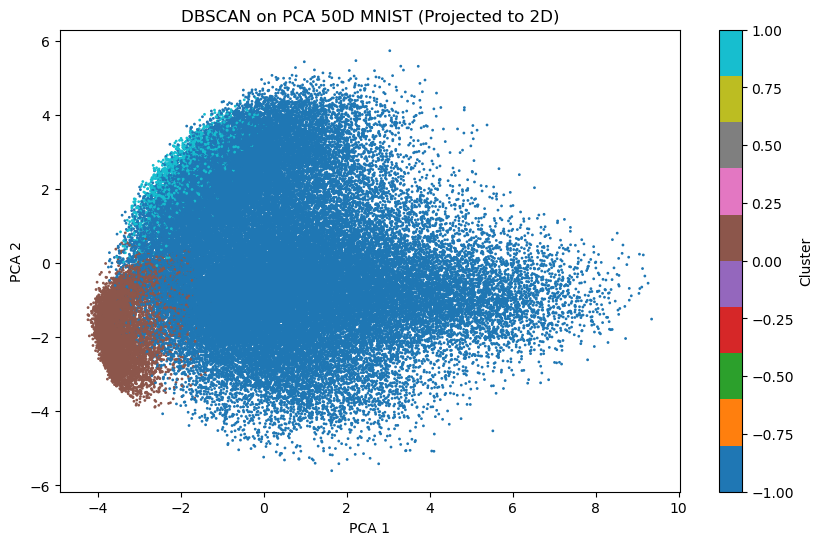

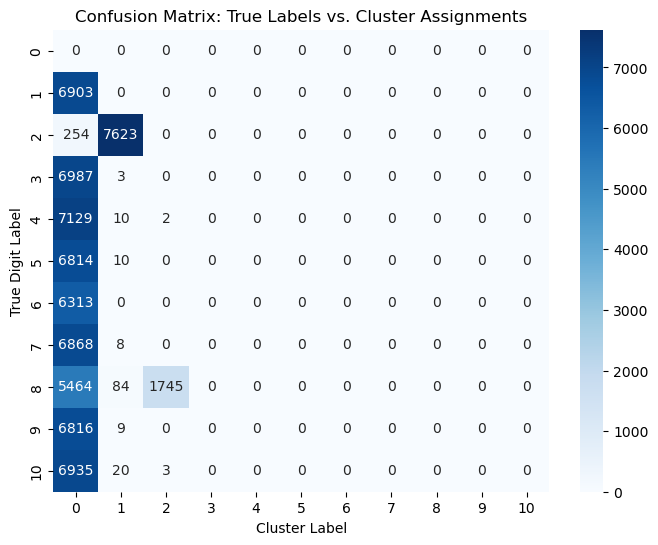

In [99]:
# PCA 2D for visualisation
pca_2d = PCA(n_components=2)
X_2d = pca_2d.fit_transform(X)  

X_2d_from_50d = pca_2d.fit_transform(X_50d) 

plot_results(X_2d_from_50d, y, dbscan_pca50_full["labels"], title="DBSCAN on PCA 50D MNIST (Projected to 2D)")

In [95]:
dbscan_pca50_full_scaled = evaluate_dbscan(X_50d_scaled, y, eps=14, min_samples=100)

DBSCAN Results (50D):
Clusters found: 1
Noise points: 7061 (10.09%)
ARI: 0.0031
NMI: 0.0211
Silhouette (non-noise): N/A


In [94]:
def suggest_eps(X2d, k):
    nn = NearestNeighbors(n_neighbors=k).fit(X2d)
    dists, _ = nn.kneighbors(X2d)
    kd = np.sort(dists[:, -1])  # k-distance
    # simple heuristics
    return {
        "median_kdist": float(np.median(kd)),
        "p80_kdist": float(np.percentile(kd, 80)),
        "p90_kdist": float(np.percentile(kd, 90))
    }

suggest_eps(X_50d_scaled, k=100)

{'median_kdist': 10.833478925363853,
 'p80_kdist': 14.975862964088952,
 'p90_kdist': 17.83626177325194}

In [104]:
eps_values = [3.0, 3.2, 3.4, 3.6, 3.8, 4.0, 4.2, 4.4]
min_samples_values = [50, 75, 100]

dbscan_pca50_results = []

for eps in eps_values:
    for ms in min_samples_values:
        print(f"Running DBSCAN with eps={eps}, min_samples={ms}")
        res = evaluate_dbscan(X_50d, y, eps=eps, min_samples=ms)
        dbscan_pca50_results.append({
            'eps': eps, 
            'min_samples': ms,
            'n_clusters': res['n_clusters'],
            'noise_points': res['noise_points'],
            'noise_pct': res['noise_pct'],
            'ARI': res.get('ARI', None),         
            'NMI': res.get('NMI', None),
            'silhouette': res.get('silhouette', None)
        })
        
dbscan_pca50_results_df = pd.DataFrame(dbscan_pca50_results)

Running DBSCAN with eps=3.0, min_samples=50
DBSCAN Results (50D):
Clusters found: 4
Noise points: 57811 (82.59%)
ARI: 0.0608
NMI: 0.2641
Silhouette (non-noise): 0.0385
Running DBSCAN with eps=3.0, min_samples=75
DBSCAN Results (50D):
Clusters found: 1
Noise points: 59711 (85.30%)
ARI: 0.0550
NMI: 0.2408
Silhouette (non-noise): N/A
Running DBSCAN with eps=3.0, min_samples=100
DBSCAN Results (50D):
Clusters found: 2
Noise points: 60483 (86.40%)
ARI: 0.0537
NMI: 0.2720
Silhouette (non-noise): 0.3131
Running DBSCAN with eps=3.2, min_samples=50
DBSCAN Results (50D):
Clusters found: 3
Noise points: 53304 (76.15%)
ARI: 0.0702
NMI: 0.2317
Silhouette (non-noise): -0.0177
Running DBSCAN with eps=3.2, min_samples=75
DBSCAN Results (50D):
Clusters found: 3
Noise points: 56783 (81.12%)
ARI: 0.0632
NMI: 0.2488
Silhouette (non-noise): 0.0630
Running DBSCAN with eps=3.2, min_samples=100
DBSCAN Results (50D):
Clusters found: 1
Noise points: 59032 (84.33%)
ARI: 0.0584
NMI: 0.2453
Silhouette (non-noise):

In [106]:
# Save DBSCAN results to CSV
results_path = "dbscan_pca50_results.csv"
dbscan_pca50_results_df.to_csv(results_path, index=False)

print(f"DBSCAN full results saved to '{results_path}'")

DBSCAN full results saved to 'dbscan_pca50_results.csv'


## DBSCAN on PCA150

In [108]:
# PCA 150D on the data
pca_150d = PCA(n_components=150)
X_150d = pca_150d.fit_transform(X)
X_150d_scaled = pca_150d.fit_transform(X_scaled)

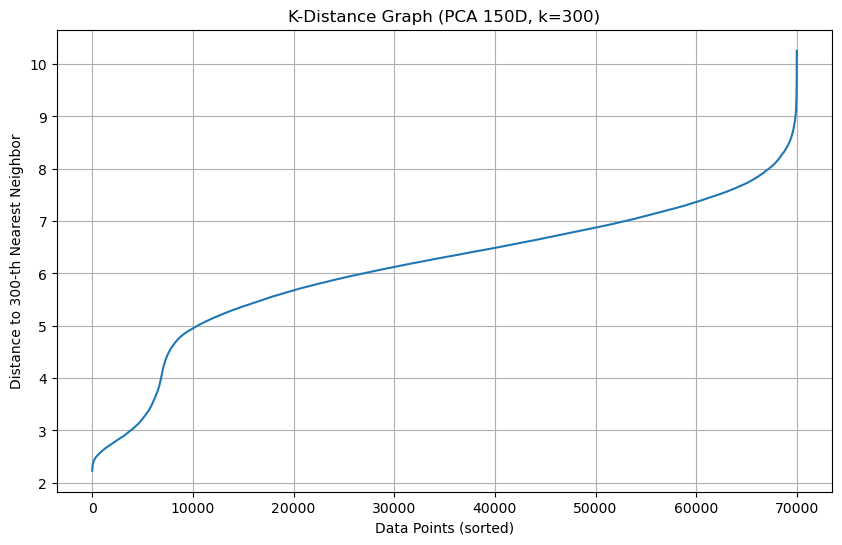

In [109]:
pca150_k300 = plot_k_distance_graph(X_150d, k=300, title_prefix="PCA 150D")

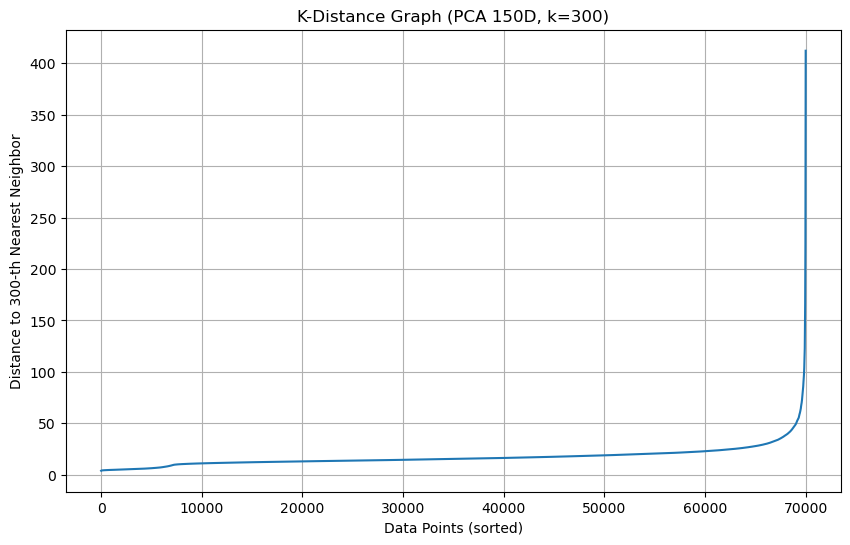

In [110]:
scaled_pca150_k300 = plot_k_distance_graph(X_150d_scaled, k=300, title_prefix="PCA 150D")

In [120]:
dbscan_pca150_full = evaluate_dbscan(X_150d, y, eps=4, min_samples=300)

DBSCAN Results (150D):
Clusters found: 1
Noise points: 62156 (88.79%)
ARI: 0.0500
NMI: 0.2383
Silhouette (non-noise): N/A


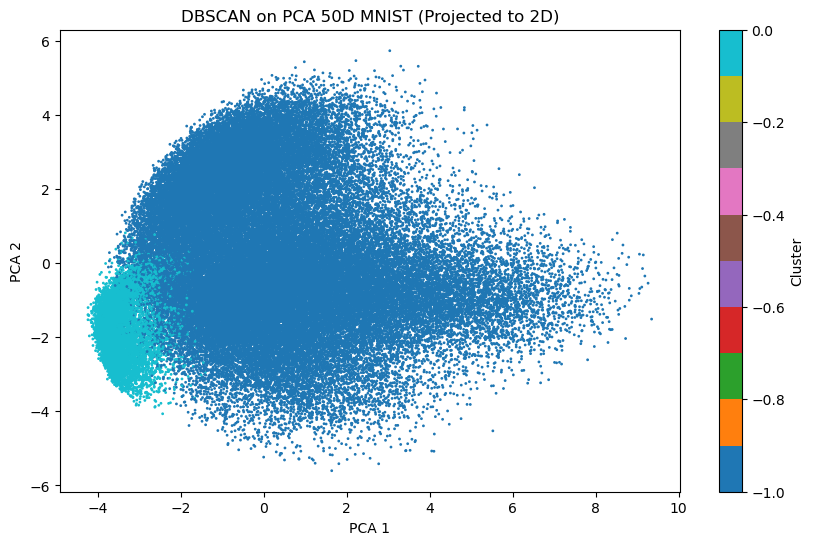

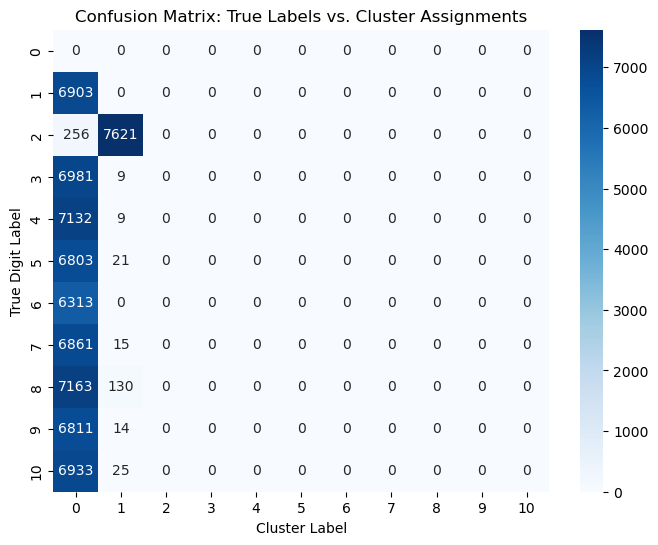

In [121]:
# PCA 2D for visualisation
pca_2d = PCA(n_components=2)
X_2d = pca_2d.fit_transform(X)  

X_2d_from_150d = pca_2d.fit_transform(X_150d) 

plot_results(X_2d_from_150d, y, dbscan_pca150_full["labels"], title="DBSCAN on PCA 50D MNIST (Projected to 2D)")

In [122]:
dbscan_pca50_full_scaled = evaluate_dbscan(X_150d_scaled, y, eps=14, min_samples=300)

DBSCAN Results (150D):
Clusters found: 1
Noise points: 24842 (35.49%)
ARI: 0.0340
NMI: 0.0714
Silhouette (non-noise): N/A


In [111]:
def suggest_eps(X2d, k):
    nn = NearestNeighbors(n_neighbors=k).fit(X2d)
    dists, _ = nn.kneighbors(X2d)
    kd = np.sort(dists[:, -1])  # k-distance
    # simple heuristics
    return {
        "median_kdist": float(np.median(kd)),
        "p80_kdist": float(np.percentile(kd, 80)),
        "p90_kdist": float(np.percentile(kd, 90))
    }

suggest_eps(X_150d, k=300)

{'median_kdist': 6.310098106253936,
 'p80_kdist': 7.146845359722758,
 'p90_kdist': 7.559430710543477}

In [123]:
eps_values = [4.3, 4.5, 4.7, 4.9, 5.1, 5.3, 5.5]
min_samples_values = [100, 125, 150, 175, 200, 250, 300]


dbscan_pca150_results = []

for eps in eps_values:
    for ms in min_samples_values:
        print(f"Running DBSCAN with eps={eps}, min_samples={ms}")
        res = evaluate_dbscan(X_150d, y, eps=eps, min_samples=ms)
        dbscan_pca150_results.append({
            'eps': eps, 
            'min_samples': ms,
            'n_clusters': res['n_clusters'],
            'noise_points': res['noise_points'],
            'noise_pct': res['noise_pct'],
            'ARI': res.get('ARI', None),         
            'NMI': res.get('NMI', None),
            'silhouette': res.get('silhouette', None)
        })
        
dbscan_pca150_results_df = pd.DataFrame(dbscan_pca150_results)

Running DBSCAN with eps=4.3, min_samples=100
DBSCAN Results (150D):
Clusters found: 2
Noise points: 52873 (75.53%)
ARI: 0.0786
NMI: 0.2725
Silhouette (non-noise): 0.1622
Running DBSCAN with eps=4.3, min_samples=125
DBSCAN Results (150D):
Clusters found: 2
Noise points: 54540 (77.91%)
ARI: 0.0709
NMI: 0.2567
Silhouette (non-noise): 0.1700
Running DBSCAN with eps=4.3, min_samples=150
DBSCAN Results (150D):
Clusters found: 1
Noise points: 56379 (80.54%)
ARI: 0.0657
NMI: 0.2404
Silhouette (non-noise): N/A
Running DBSCAN with eps=4.3, min_samples=175
DBSCAN Results (150D):
Clusters found: 1
Noise points: 57466 (82.09%)
ARI: 0.0619
NMI: 0.2370
Silhouette (non-noise): N/A
Running DBSCAN with eps=4.3, min_samples=200
DBSCAN Results (150D):
Clusters found: 2
Noise points: 58458 (83.51%)
ARI: 0.0597
NMI: 0.2436
Silhouette (non-noise): 0.1014
Running DBSCAN with eps=4.3, min_samples=250
DBSCAN Results (150D):
Clusters found: 2
Noise points: 59272 (84.67%)
ARI: 0.0587
NMI: 0.2789
Silhouette (non-n

In [124]:
dbscan_pca150_results_df

,eps,min_samples,n_clusters,noise_points,noise_pct,ARI,NMI,silhouette
0,4.3,100,2,52873,75.532857,0.078633,0.272501,0.162162
1,4.3,125,2,54540,77.914286,0.070939,0.256741,0.170032
2,4.3,150,1,56379,80.541429,0.065700,0.240355,NaN
3,4.3,175,1,57466,82.094286,0.061869,0.236951,NaN
4,4.3,200,2,58458,83.511429,0.059662,0.243610,0.101417
5,4.3,250,2,59272,84.674286,0.058674,0.278928,0.273092
6,4.3,300,2,59861,85.515714,0.055855,0.269267,0.278654
7,4.5,100,4,48439,69.198571,0.087786,0.240595,0.025669
8,4.5,125,1,50601,72.287143,0.082794,0.234769,NaN
9,4.5,150,2,52161,74.515714,0.081150,0.270454,0.159775


In [125]:
# Save DBSCAN results to CSV
results_path = "dbscan_pca150_results.csv"
dbscan_pca150_results_df.to_csv(results_path, index=False)

print(f"DBSCAN full results saved to '{results_path}'")

DBSCAN full results saved to 'dbscan_pca150_results.csv'


# Agglomerative Clustering

In [21]:
def evaluate_agglo(X, y, n_clusters=10, linkage='ward'):
    agg = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
    labels = agg.fit_predict(X)

    # Metrics
    ari = adjusted_rand_score(y, labels)
    nmi = normalized_mutual_info_score(y, labels)
    sil = silhouette_score(X, labels) if len(set(labels)) > 1 else None

    print(f"Agglomerative Clustering Results ({linkage}, {X.shape[1]}D):")
    print(f"ARI: {ari:.4f}")
    print(f"NMI: {nmi:.4f}")
    print(f"Silhouette Score: {sil:.4f}" if sil is not None else "Silhouette Score: N/A")

    return {
        "labels": labels,
        "ari": ari,
        "nmi": nmi,
        "silhouette": sil
    }

### Full data

In [22]:
X_sample, y_sample = resample(X, y, n_samples=10000, random_state=42)
X_sample_scaled, y_sample_scaled = resample(X_scaled, y, n_samples=10000, random_state=42)

In [23]:
# Agglo on full data
agg_full_result = evaluate_agglo(X_sample, y_sample, linkage='ward')

Agglomerative Clustering Results (ward, 784D):
ARI: 0.4705
NMI: 0.6554
Silhouette Score: 0.0316


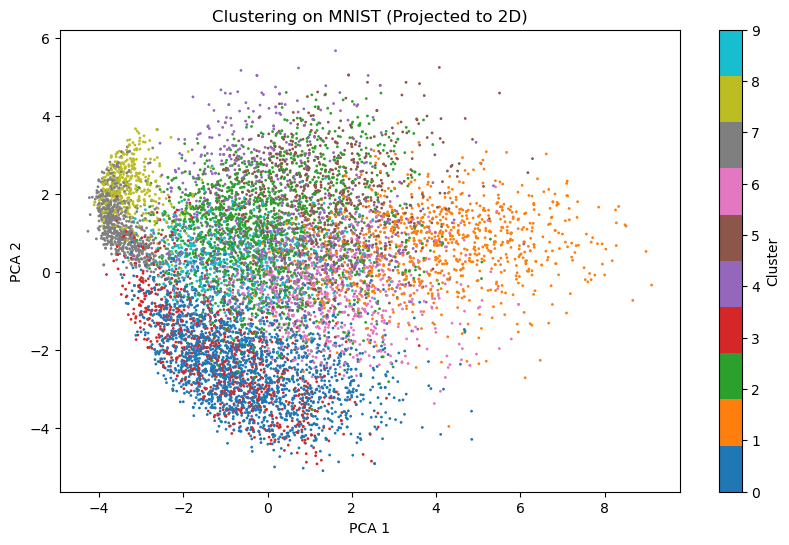

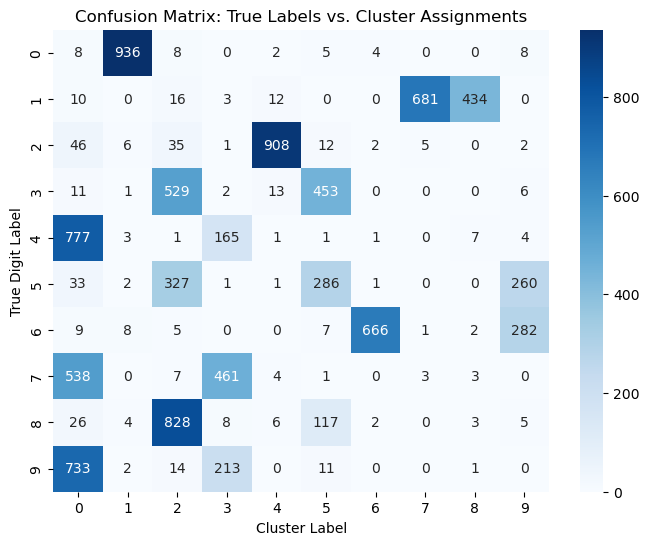

In [24]:
# PCA 2D for visualisation
X_2d_resample = pca_2d.fit_transform(X_sample)  

plot_results(X_2d_resample, y_sample, agg_full_result['labels'], plot_scatter=True, plot_cm=True)

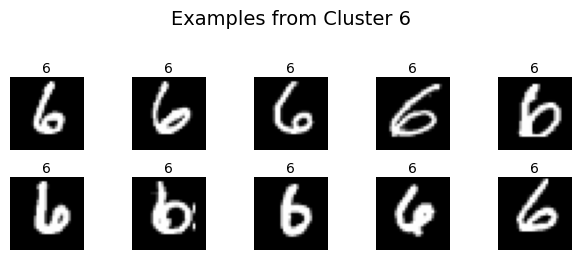

In [25]:
show_cluster_examples(X_sample, y_sample, agg_full_result['labels'], cluster_id=6, num_images=10, cell_size=1.25, cols=5)

In [27]:
linkages = ['ward', 'complete', 'average', 'single']
agg_results = {}

for link in linkages:
    result = evaluate_agglo(X_sample, y_sample, linkage=link)
    agg_results[link] = result


Agglomerative Clustering Results (ward, 784D):
ARI: 0.4705
NMI: 0.6554
Silhouette Score: 0.0316
Agglomerative Clustering Results (complete, 784D):
ARI: 0.1378
NMI: 0.3343
Silhouette Score: 0.0190
Agglomerative Clustering Results (average, 784D):
ARI: 0.0476
NMI: 0.2426
Silhouette Score: 0.0617
Agglomerative Clustering Results (single, 784D):
ARI: 0.0000
NMI: 0.0018
Silhouette Score: 0.0471


In [26]:
linkages = ['ward', 'complete', 'average', 'single']
agg_results = {}

for link in linkages:
    start = time.time()
    result = evaluate_agglo(X_sample, y_sample, linkage=link)
    elapsed = time.time() - start
    agg_results[link] = result
    print(f"{link} took {elapsed:.2f} seconds")

Agglomerative Clustering Results (ward, 784D):
ARI: 0.4705
NMI: 0.6554
Silhouette Score: 0.0316
ward took 52.02 seconds
Agglomerative Clustering Results (complete, 784D):
ARI: 0.1378
NMI: 0.3343
Silhouette Score: 0.0190
complete took 56.00 seconds
Agglomerative Clustering Results (average, 784D):
ARI: 0.0476
NMI: 0.2426
Silhouette Score: 0.0617
average took 56.40 seconds
Agglomerative Clustering Results (single, 784D):
ARI: 0.0000
NMI: 0.0018
Silhouette Score: 0.0471
single took 66.76 seconds


In [27]:
agg_full_scaled_result = evaluate_agglo(X_sample_scaled, y_sample_scaled, linkage='ward')

Agglomerative Clustering Results (ward, 784D):
ARI: 0.4379
NMI: 0.6084
Silhouette Score: -0.0505


### PCA2D

In [28]:
# Agglo on PCA2D data
pca_2d = PCA(n_components=2)
X_2d_resample = pca_2d.fit_transform(X_sample) 
print("Shape after PCA:", X_2d_resample.shape)

agg_2d_result = evaluate_agglo(X_2d_resample, y_sample, linkage='ward')

Shape after PCA: (10000, 2)
Agglomerative Clustering Results (ward, 2D):
ARI: 0.2304
NMI: 0.3621
Silhouette Score: 0.3010


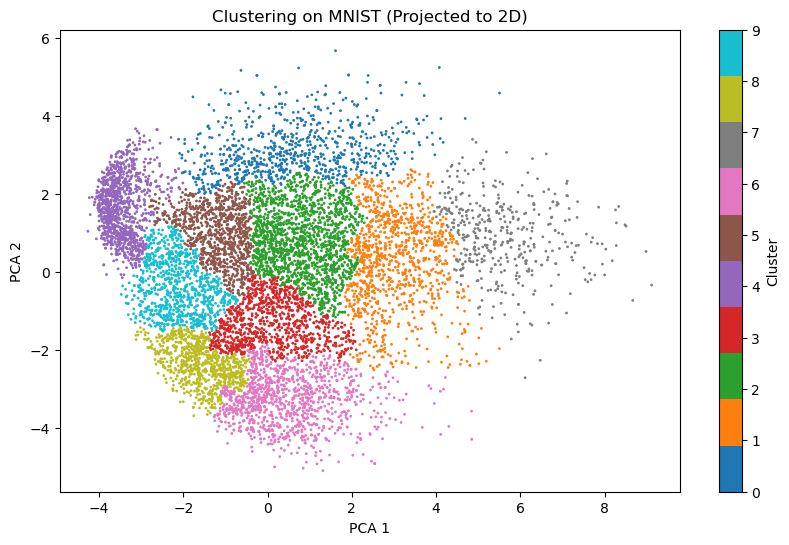

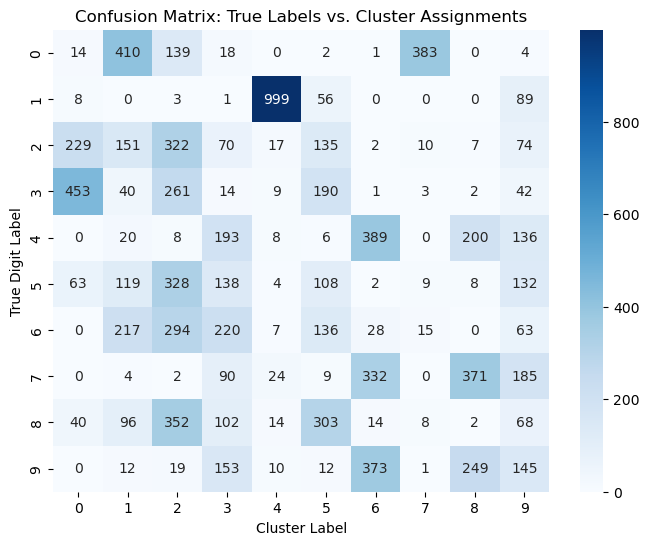

In [29]:
# PCA 2D for visualisation
plot_results(X_2d_resample, y_sample, agg_2d_result['labels'], plot_scatter=True, plot_cm=True)

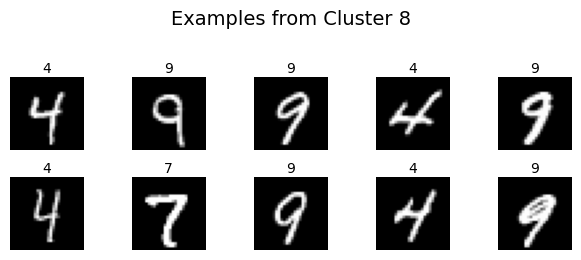

In [30]:
show_cluster_examples(X_sample, y_sample, agg_2d_result['labels'], cluster_id=8, num_images=10, cell_size=1.25, cols=5)

In [31]:
# Agglo on PCA2D scaled data
pca_2d = PCA(n_components=2)
X_2d_scaled_resample = pca_2d.fit_transform(X_sample_scaled) 
print("Shape after PCA:",X_2d_scaled_resample.shape)

agg_2d_result = evaluate_agglo(X_2d_scaled_resample, y_sample_scaled, linkage='ward')

Shape after PCA: (10000, 2)
Agglomerative Clustering Results (ward, 2D):
ARI: 0.1270
NMI: 0.1903
Silhouette Score: 0.2850


### PCA50D

In [32]:
# Agglo on PCA50D data
pca_50d = PCA(n_components=50)
X_50d_resample = pca_50d.fit_transform(X_sample) 
print("Shape after PCA:", X_50d_resample.shape)

agg_50d_result = evaluate_agglo(X_50d_resample, y_sample, linkage='ward')

Shape after PCA: (10000, 50)
Agglomerative Clustering Results (ward, 50D):
ARI: 0.5054
NMI: 0.6558
Silhouette Score: 0.0513


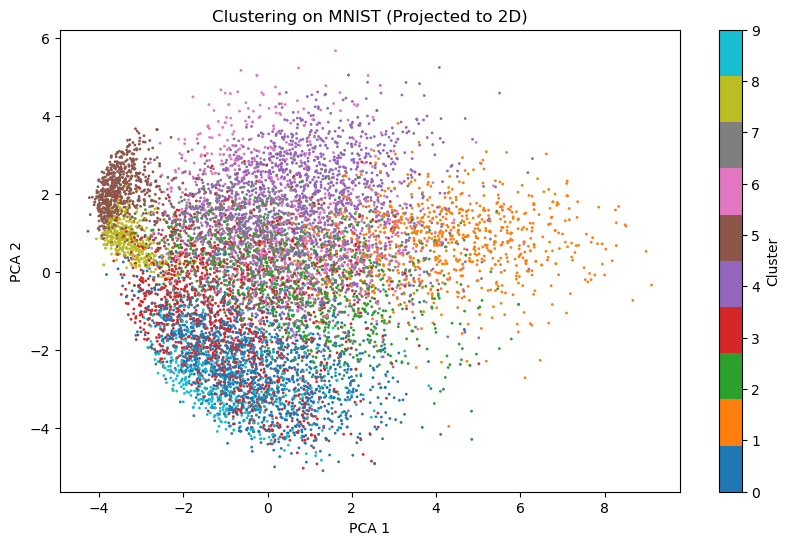

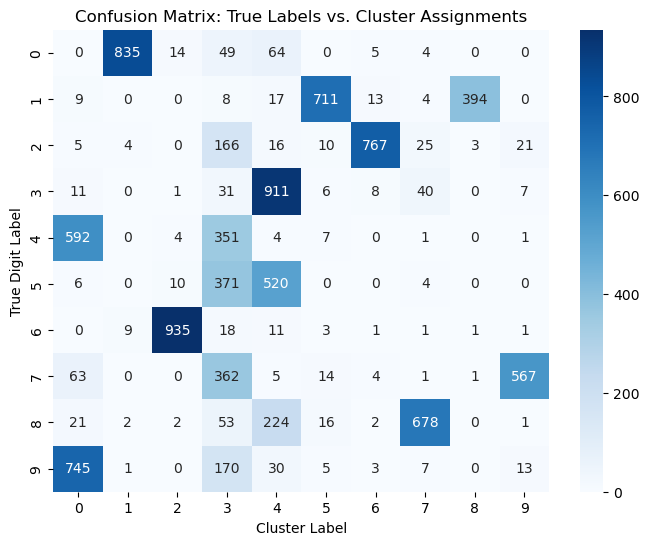

In [33]:
# PCA 2D for visualisation
X_2d_from_50d_resample = pca_2d.fit_transform(X_50d_resample)  

plot_results(X_2d_from_50d_resample, y_sample, agg_50d_result['labels'], plot_scatter=True, plot_cm=True)

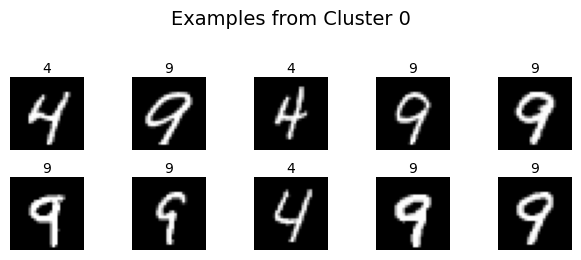

In [34]:
show_cluster_examples(X_sample, y_sample, agg_50d_result['labels'], cluster_id=0, num_images=10, cell_size=1.25, cols=5)

In [35]:
# Store results
ari_results_agglo = {}
nmi_results_agglo = {}
sil_results_agglo = {}
acc_results_agglo = {}

# PCA with various dimensions
pca_dimensions = [2, 3, 4, 5, 6, 7, 8, 9, 10, 50, 150]

for dim in pca_dimensions:
    pca = PCA(n_components=dim)
    X_pca = pca.fit_transform(X_sample)
    
    agg = AgglomerativeClustering(n_clusters=10, linkage='ward')
    clusters_pca = agg.fit_predict(X_pca)
    
    ari_results_agglo[f"{dim}D"] = adjusted_rand_score(y_sample, clusters_pca)
    nmi_results_agglo[f"{dim}D"] = normalized_mutual_info_score(y_sample, clusters_pca)
    sil_results_agglo[f"{dim}D"] = silhouette_score(X_pca, clusters_pca)
    acc_results_agglo[f"{dim}D"] = clustering_accuracy(y_sample, clusters_pca)

# Full data (784D)
agg = AgglomerativeClustering(n_clusters=10, linkage='ward')
clusters_full = agg.fit_predict(X_sample)
ari_results_agglo["784D"] = adjusted_rand_score(y_sample, clusters_full)
nmi_results_agglo["784D"] = normalized_mutual_info_score(y_sample, clusters_full)
sil_results_agglo["784D"] = silhouette_score(X_sample, clusters_full)
acc_results_agglo["784D"] = clustering_accuracy(y_sample, clusters_full)

In [36]:
# Combine all results into a DataFrame
agglo_hw_results_df = pd.DataFrame({
    "PCA_Dimension": list(ari_results_agglo.keys()),
    "ARI": list(ari_results_agglo.values()),
    "NMI": list(nmi_results_agglo.values()),
    "Silhouette": list(sil_results_agglo.values()),
    "Accuracy": list(acc_results_agglo.values())
})

# Save to CSV
results_path = "agglo_hw_results.csv"
agglo_hw_results_df.to_csv(results_path, index=False)

print(f"Results saved to {results_path}")

Results saved to agglo_hw_results.csv


In [37]:
agglo_hw_results_df

,PCA_Dimension,ARI,NMI,Silhouette,Accuracy
0,2D,0.249372,0.366639,0.307340,0.4003
1,3D,0.241147,0.348199,0.212416,0.4100
2,4D,0.266406,0.386914,0.185068,0.4111
3,5D,0.315536,0.451270,0.148632,0.4626
4,6D,0.287119,0.449240,0.140259,0.4276
5,7D,0.347947,0.502605,0.111231,0.5088
6,8D,0.433544,0.567604,0.116784,0.6150
7,9D,0.428254,0.574888,0.114851,0.5600
8,10D,0.355071,0.512892,0.115536,0.5069
9,50D,0.451278,0.631543,0.054658,0.5759


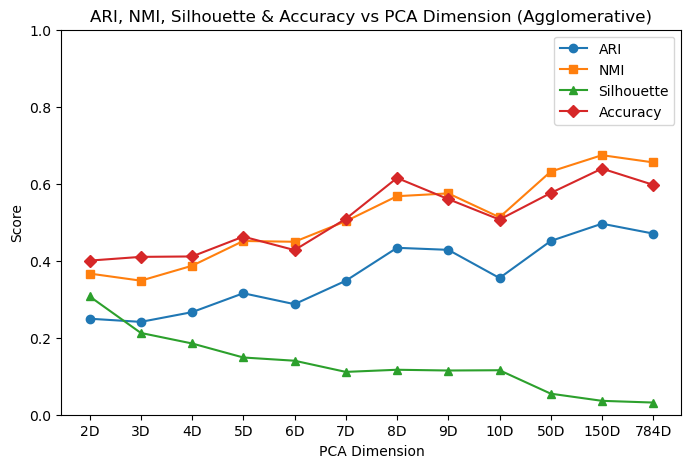

In [38]:
# Use Agglomerative results dictionaries
dims = list(ari_results_agglo.keys())
ari_values = list(ari_results_agglo.values())
nmi_values = list(nmi_results_agglo.values())
sil_values = list(sil_results_agglo.values())
acc_values = list(acc_results_agglo.values())


plt.figure(figsize=(8, 5))
plt.plot(dims, ari_values, marker='o', label="ARI")
plt.plot(dims, nmi_values, marker='s', label="NMI")
plt.plot(dims, sil_values, marker='^', label="Silhouette")
plt.plot(dims, acc_values, marker='D', label="Accuracy")
plt.title("ARI, NMI, Silhouette & Accuracy vs PCA Dimension (Agglomerative)")
plt.xlabel("PCA Dimension")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.legend()
plt.show()

# GMM

In [22]:
n_components_range = range(2, 20)
gmm_covariance_types = ['full', 'tied', 'diag', 'spherical']

# Store results
bic_results = {}
aic_results = {}

for cov in gmm_covariance_types:
    print(f"\nStarting GMM with covariance_type = '{cov}'...")
    start_time = time.time()

    bic_scores = []
    aic_scores = []

    for k in n_components_range:
        gmm = GaussianMixture(n_components=k, covariance_type=cov, random_state=42, max_iter=500)
        gmm.fit(X)
        bic = gmm.bic(X)
        aic = gmm.aic(X)
        bic_scores.append(bic)
        aic_scores.append(aic)

        print(f"k = {k}: BIC = {bic:.2f}, AIC = {aic:.2f}")

    bic_results[cov] = bic_scores
    aic_results[cov] = aic_scores

    elapsed = time.time() - start_time
    print(f"Done with '{cov}'. Time taken: {elapsed:.2f} seconds.")


Starting GMM with covariance_type = 'full'...
k = 2: BIC = -259545902.72, AIC = -265195391.70
k = 3: BIC = -283779905.22, AIC = -292254143.26
k = 4: BIC = -300367133.48, AIC = -311666120.59
k = 5: BIC = -315274222.66, AIC = -329397958.84
k = 6: BIC = -318999288.16, AIC = -335947773.41
k = 7: BIC = -318993427.32, AIC = -338766661.64
k = 8: BIC = -322885542.42, AIC = -345483525.80
k = 9: BIC = -323936821.17, AIC = -349359553.62
k = 10: BIC = -326015687.26, AIC = -354263168.77
k = 11: BIC = -326949338.60, AIC = -358021569.18
k = 12: BIC = -327694399.37, AIC = -361591379.02
k = 13: BIC = -326464966.51, AIC = -363186695.23
k = 14: BIC = -325993486.33, AIC = -365539964.12
k = 15: BIC = -323895940.91, AIC = -366267167.76
k = 16: BIC = -324733823.11, AIC = -369929799.03
k = 17: BIC = -323657969.03, AIC = -371678694.01
k = 18: BIC = -321017384.90, AIC = -371862858.95
k = 19: BIC = -318353705.83, AIC = -372023928.94
Done with 'full'. Time taken: 37237.73 seconds.

Starting GMM with covariance_t

In [23]:
# Combine BIC and AIC results into a single DataFrame
gmm_bic_aic_hw_df = pd.DataFrame([
    {
        "Covariance_Type": cov,
        "n_components": k,
        "BIC": bic_results[cov][i],
        "AIC": aic_results[cov][i]
    }
    for cov in gmm_covariance_types
    for i, k in enumerate(n_components_range)
])

# Save to CSV
results_path = "gmm_bic_aic_hw_results.csv"
gmm_bic_aic_hw_df.to_csv(results_path, index=False)

print(f"GMM BIC/AIC results saved to '{results_path}'")

GMM BIC/AIC results saved to 'gmm_bic_aic_hw_results.csv'


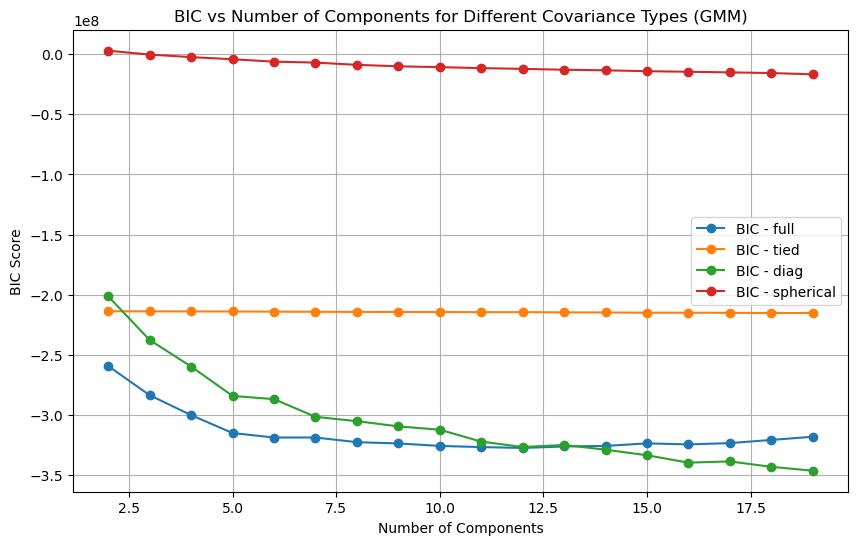

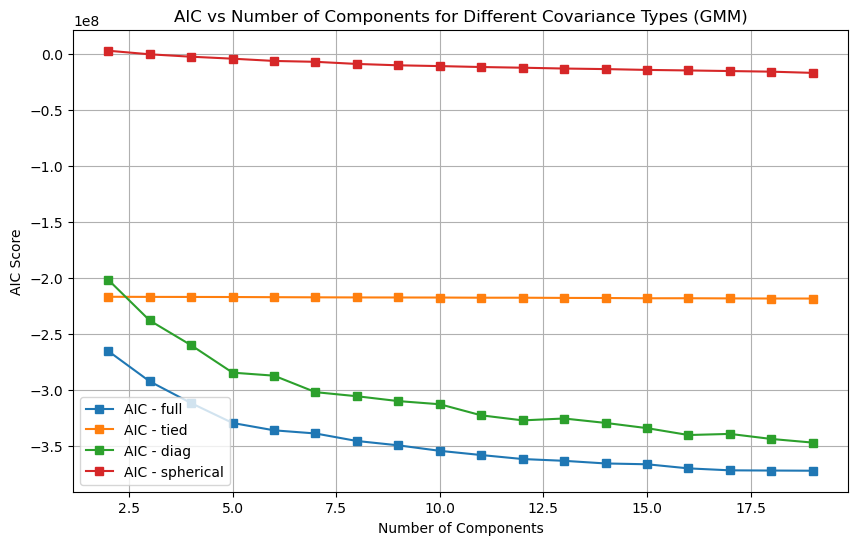

In [26]:
plt.figure(figsize=(10, 6))

# Plot BIC
for cov in gmm_covariance_types:
    plt.plot(n_components_range, bic_results[cov], marker='o', label=f"BIC - {cov}")

plt.title("BIC vs Number of Components for Different Covariance Types (GMM)")
plt.xlabel("Number of Components")
plt.ylabel("BIC Score")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))

# Plot AIC
for cov in gmm_covariance_types:
    plt.plot(n_components_range, aic_results[cov], marker='s', label=f"AIC - {cov}")

plt.title("AIC vs Number of Components for Different Covariance Types (GMM)")
plt.xlabel("Number of Components")
plt.ylabel("AIC Score")
plt.legend()
plt.grid(True)
plt.show()


In [42]:
def evaluate_gmm(X, y):
    cov_types = ('full', 'tied', 'diag', 'spherical')  

    print(f"GMM Results ({X.shape[1]}D)")

    results = {}
    for cov in cov_types:
        print(f"\nRunning GMM with covariance_type = '{cov}'")
        start = time.time()

        gmm = GaussianMixture(n_components=10, covariance_type=cov, random_state=42)
        labels = gmm.fit_predict(X)

        elapsed = time.time() - start
        ari = adjusted_rand_score(y, labels)
        nmi = normalized_mutual_info_score(y, labels)
        try:
            sil = silhouette_score(X, labels)
        except ValueError:
            sil = None
        acc = clustering_accuracy(y, labels)

        results[cov] = {
            "labels": labels,
            "ARI": ari,
            "NMI": nmi,
            "Silhouette": sil,
            "Accuracy": acc,
            "Time_sec": elapsed
        }

        print(f"Time taken: {elapsed:.2f} sec")
        print(f"ARI: {ari:.4f}")
        print(f"NMI: {nmi:.4f}")
        print(f"Silhouette Score: {sil:.4f}" if sil is not None else "Silhouette Score: N/A")

    return results

In [60]:
# GMM on FUll data
GMM_full_result = evaluate_gmm(X, y)

GMM Results (784D)

Running GMM with covariance_type = 'full'
Time taken: 2780.12 sec
ARI: 0.2087
NMI: 0.3545
Silhouette Score: -0.0062

Running GMM with covariance_type = 'tied'
Time taken: 773.52 sec
ARI: 0.1142
NMI: 0.3263
Silhouette Score: -0.0079

Running GMM with covariance_type = 'diag'
Time taken: 62.85 sec
ARI: 0.1775
NMI: 0.2836
Silhouette Score: 0.0045

Running GMM with covariance_type = 'spherical'
Time taken: 22.05 sec
ARI: 0.3296
NMI: 0.4983
Silhouette Score: 0.0352


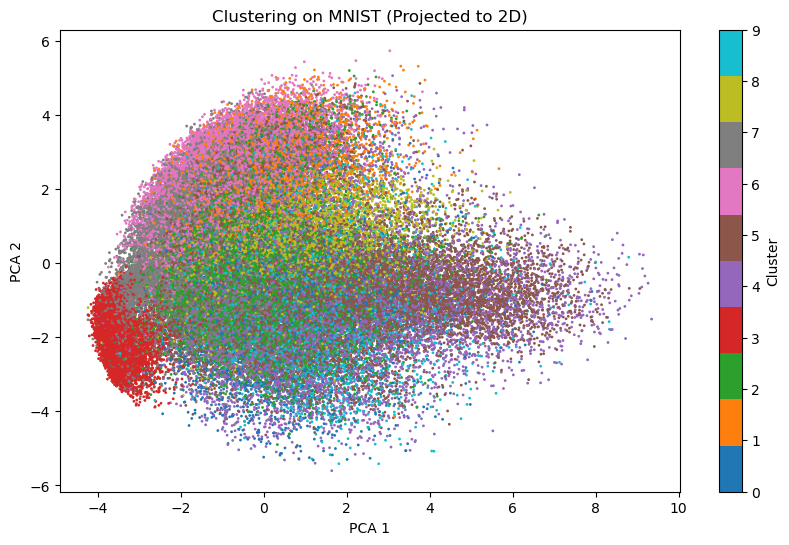

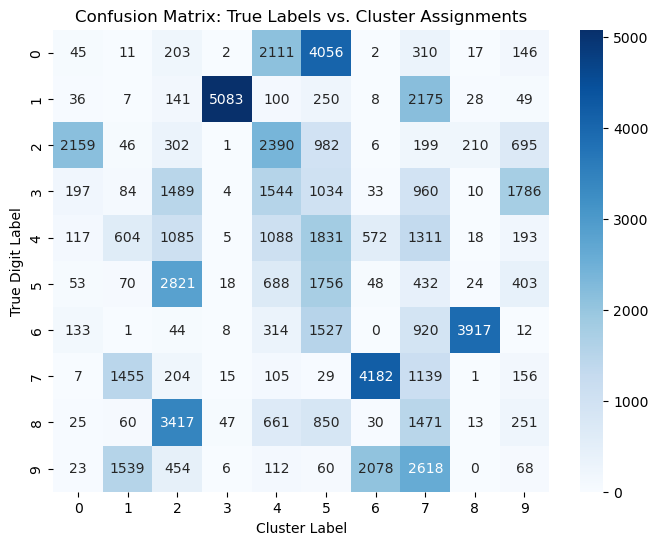

In [61]:
# PCA 2D for visualisation
pca_2d = PCA(n_components=2)
X_2d = pca_2d.fit_transform(X) 

plot_results(X_2d, y, GMM_full_result['full']['labels'], plot_scatter=True, plot_cm=True)

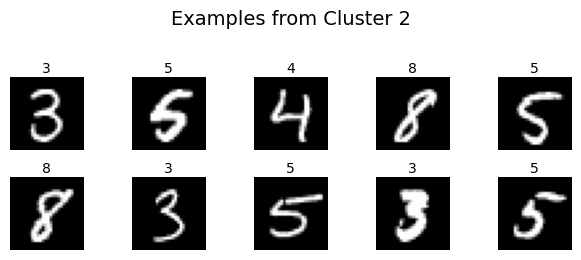

In [62]:
show_cluster_examples(X, y, GMM_full_result['full']['labels'], cluster_id=2, num_images=10, cell_size=1.25, cols=5)

In [43]:
# GMM on PCA2D data
pca_2d = PCA(n_components=2)
X_2d = pca_2d.fit_transform(X) 

GMM_2d_result = evaluate_gmm(X_2d, y)

GMM Results (2D)

Running GMM with covariance_type = 'full'
Time taken: 2.15 sec
ARI: 0.2265
NMI: 0.3619
Silhouette Score: 0.3414

Running GMM with covariance_type = 'tied'
Time taken: 1.26 sec
ARI: 0.2402
NMI: 0.3597
Silhouette Score: 0.3383

Running GMM with covariance_type = 'diag'
Time taken: 0.87 sec
ARI: 0.2270
NMI: 0.3593
Silhouette Score: 0.3424

Running GMM with covariance_type = 'spherical'
Time taken: 0.87 sec
ARI: 0.2211
NMI: 0.3555
Silhouette Score: 0.3457


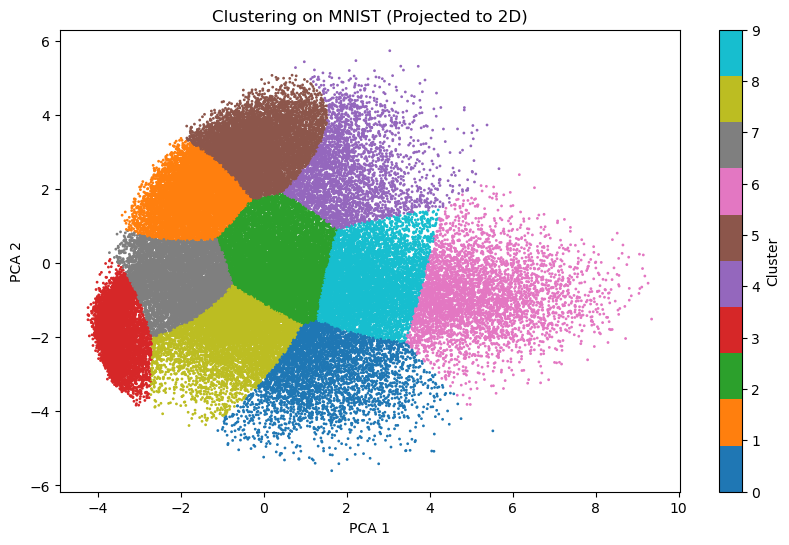

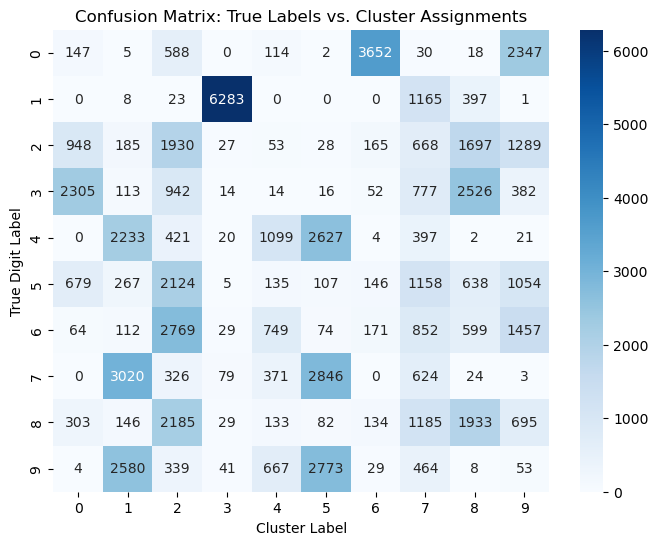

In [46]:
# PCA 2D for visualisation
plot_results(X_2d, y, GMM_2d_result['full']['labels'], plot_scatter=True, plot_cm=True)

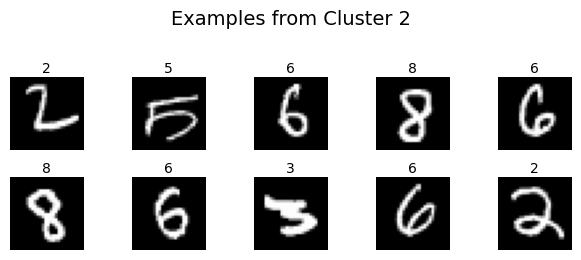

In [48]:
show_cluster_examples(X, y, GMM_2d_result['full']['labels'], cluster_id=2, num_images=10, cell_size=1.25, cols=5)

In [49]:
# GMM on PCA3D data
pca_3d = PCA(n_components=3)
X_3d = pca_3d.fit_transform(X) 

GMM_3d_result = evaluate_gmm(X_3d, y)

GMM Results (3D)

Running GMM with covariance_type = 'full'
Time taken: 3.28 sec
ARI: 0.2217
NMI: 0.3653
Silhouette Score: 0.2349

Running GMM with covariance_type = 'tied'
Time taken: 2.18 sec
ARI: 0.2301
NMI: 0.3371
Silhouette Score: 0.2599

Running GMM with covariance_type = 'diag'
Time taken: 1.51 sec
ARI: 0.2197
NMI: 0.3449
Silhouette Score: 0.2542

Running GMM with covariance_type = 'spherical'
Time taken: 0.83 sec
ARI: 0.2333
NMI: 0.3494
Silhouette Score: 0.2626


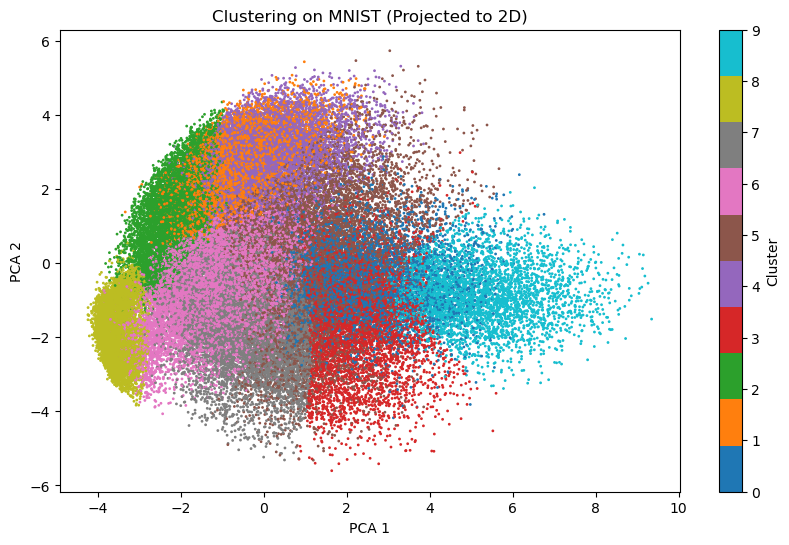

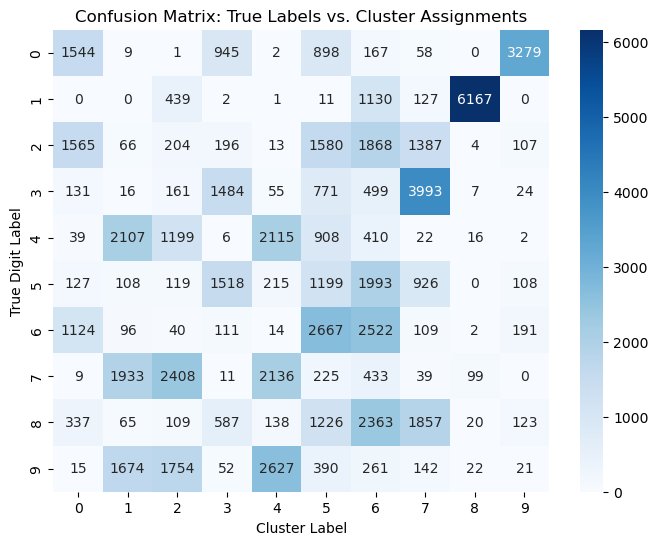

In [51]:
# PCA 2D for visualisation
X_2d_from_3d = pca_2d.fit_transform(X_3d)  

plot_results(X_2d_from_3d, y, GMM_3d_result['full']['labels'], plot_scatter=True, plot_cm=True)

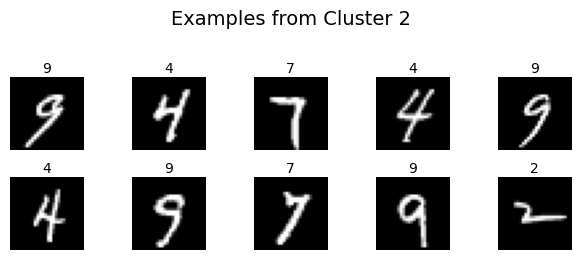

In [53]:
show_cluster_examples(X, y, GMM_3d_result['full']['labels'], cluster_id=2, num_images=10, cell_size=1.25, cols=5)

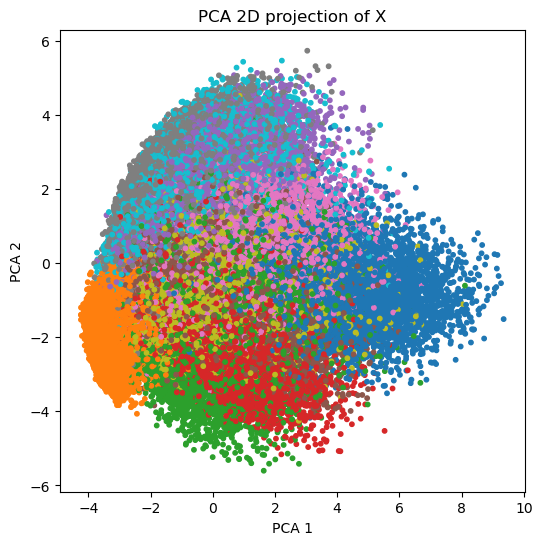

In [50]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 6))
plt.scatter(X_2d[:, 0], X_2d[:, 1], c=y, cmap='tab10', s=10)
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('PCA 2D projection of X')
plt.show()


In [54]:
# GMM on PCA10D data
pca_10d = PCA(n_components=10)
X_10d = pca_10d.fit_transform(X) 

GMM_10d_result = evaluate_gmm(X_10d, y)

GMM Results (10D)

Running GMM with covariance_type = 'full'
Time taken: 4.95 sec
ARI: 0.4423
NMI: 0.5779
Silhouette Score: 0.1319

Running GMM with covariance_type = 'tied'
Time taken: 2.01 sec
ARI: 0.3515
NMI: 0.4801
Silhouette Score: 0.1693

Running GMM with covariance_type = 'diag'
Time taken: 1.81 sec
ARI: 0.3593
NMI: 0.4883
Silhouette Score: 0.1512

Running GMM with covariance_type = 'spherical'
Time taken: 1.24 sec
ARI: 0.3501
NMI: 0.4722
Silhouette Score: 0.1731


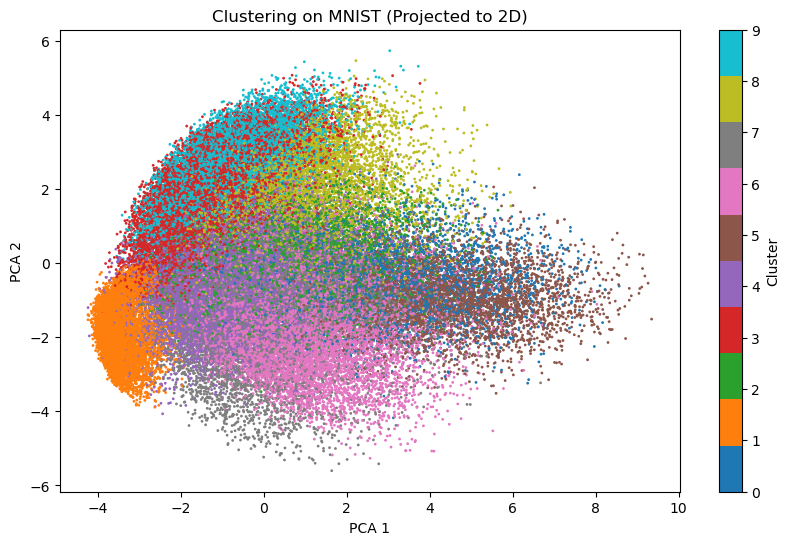

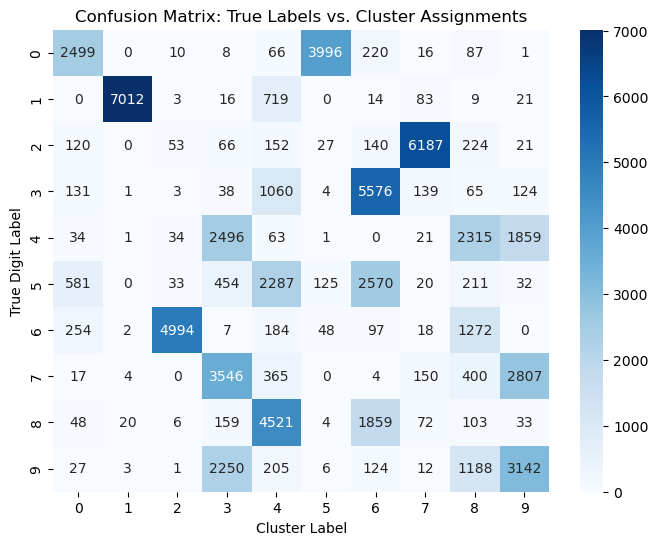

In [55]:
# PCA 2D for visualisation
X_2d_from_10d = pca_2d.fit_transform(X_10d)  

plot_results(X_2d_from_10d, y, GMM_10d_result['full']['labels'], plot_scatter=True, plot_cm=True)

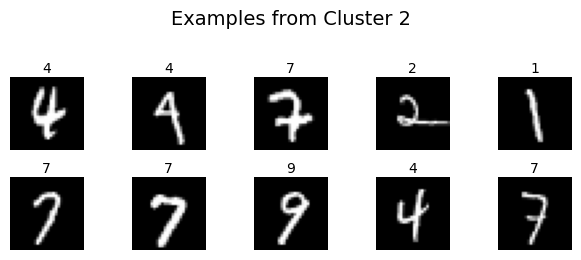

In [56]:
show_cluster_examples(X, y, GMM_3d_result['full']['labels'], cluster_id=2, num_images=10, cell_size=1.25, cols=5)

In [58]:
cov_types = ('full','tied','diag','spherical')

# Tore results
ari_results_gmm = {cov: {} for cov in cov_types}
nmi_results_gmm = {cov: {} for cov in cov_types}
sil_results_gmm = {cov: {} for cov in cov_types}
acc_results_gmm = {cov: {} for cov in cov_types}

# PCA with various dimensions
pca_dimensions = [2, 3, 4, 5, 6, 7, 8, 9, 10, 50, 150]

for dim in pca_dimensions:
    pca = PCA(n_components=dim)
    X_pca = pca.fit_transform(X)
    
    for cov in cov_types:
        gmm = GaussianMixture(n_components=10, covariance_type=cov, random_state=42)
        labels = gmm.fit_predict(X_pca)
        
        ari_results_gmm[cov][f"{dim}D"] = adjusted_rand_score(y, labels)
        nmi_results_gmm[cov][f"{dim}D"] = normalized_mutual_info_score(y, labels)
        try:
            sil_results_gmm[cov][f"{dim}D"] = silhouette_score(X_pca, labels)
        except ValueError:
            sil_results_gmm[cov][f"{dim}D"] = None
        acc_results_gmm[cov][f"{dim}D"] = clustering_accuracy(y, labels)

# Full data (784D baseline)
for cov in cov_types:
    gmm = GaussianMixture(n_components=10, covariance_type=cov, random_state=42)
    labels = gmm.fit_predict(X)
    
    ari_results_gmm[cov]["784D"] = adjusted_rand_score(y, labels)
    nmi_results_gmm[cov]["784D"] = normalized_mutual_info_score(y, labels)
    try:
        sil_results_gmm[cov]["784D"] = silhouette_score(X, labels)
    except ValueError:
        sil_results_gmm[cov]["784D"] = None
    acc_results_gmm[cov]["784D"] = clustering_accuracy(y, labels)

In [63]:
gmm_hw_results = []
for cov in cov_types:
    for dim in ari_results_gmm[cov].keys():
        gmm_hw_results.append({
            "Covariance_Type": cov,
            "Dimension": dim,
            "ARI": ari_results_gmm[cov][dim],
            "NMI": nmi_results_gmm[cov][dim],
            "Silhouette": sil_results_gmm[cov][dim],
            "Accuracy": acc_results_gmm[cov][dim]
        })

In [67]:
gmm_hw_results_df = pd.DataFrame(gmm_hw_results)
gmm_hw_results_df.to_csv("gmm_hw_results.csv", index=True)

In [72]:
gmm_hw_results_df

,Covariance_Type,Dimension,ARI,NMI,Silhouette,Accuracy
0,full,2D,0.227780,0.362171,0.342052,0.380943
1,full,3D,0.227102,0.368485,0.234741,0.400771
2,full,4D,0.305418,0.440535,0.199965,0.458857
3,full,5D,0.332785,0.474383,0.174336,0.463143
4,full,6D,0.347512,0.524759,0.144938,0.483171
5,full,7D,0.410761,0.565250,0.139817,0.547057
6,full,8D,0.448161,0.600953,0.135264,0.579857
7,full,9D,0.497769,0.616673,0.137305,0.645029
8,full,10D,0.433395,0.580302,0.112998,0.599171
9,full,50D,0.448649,0.618849,0.042269,0.604243


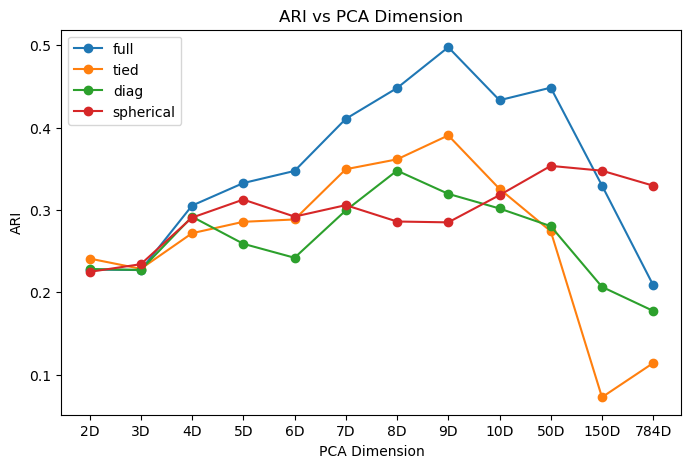

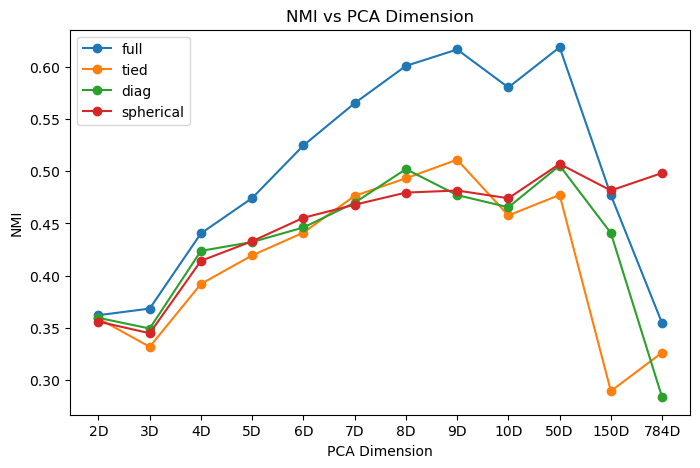

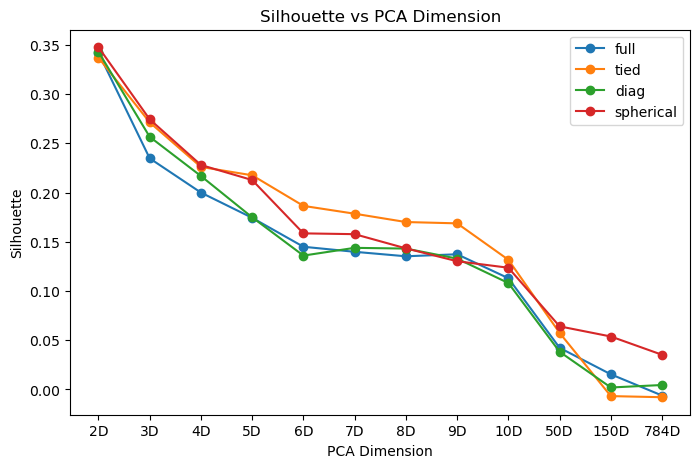

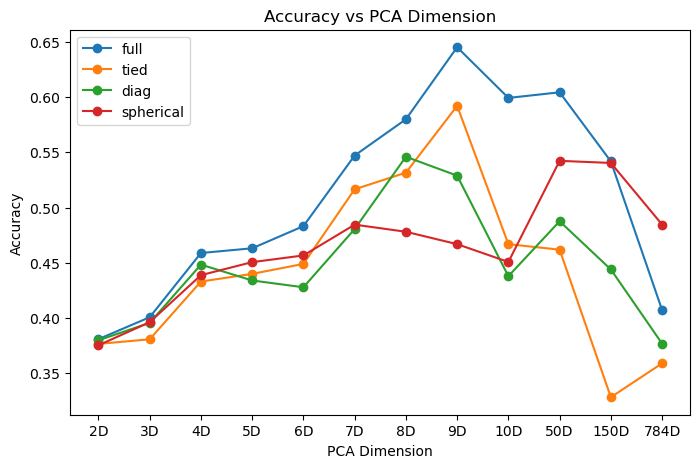

In [69]:
metrics = ["ARI", "NMI", "Silhouette", "Accuracy"]

for metric in metrics:
    plt.figure(figsize=(8, 5))
    for cov in gmm_hw_results_df["Covariance_Type"].unique():
        subset = gmm_hw_results_df[gmm_hw_results_df["Covariance_Type"] == cov]
        plt.plot(subset["Dimension"], subset[metric], marker='o', label=cov)
    
    plt.title(f"{metric} vs PCA Dimension")
    plt.xlabel("PCA Dimension")
    plt.ylabel(metric)
    plt.legend()
    plt.show()


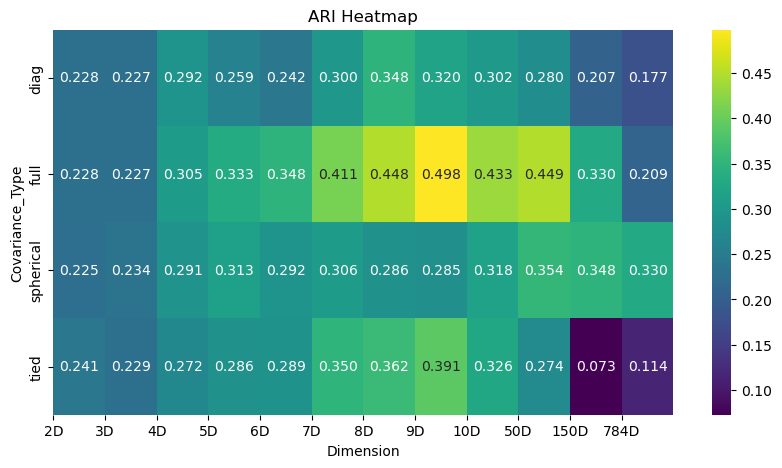

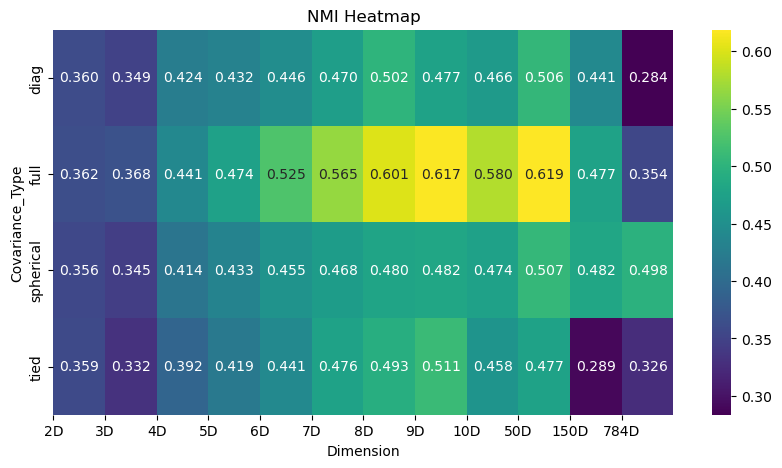

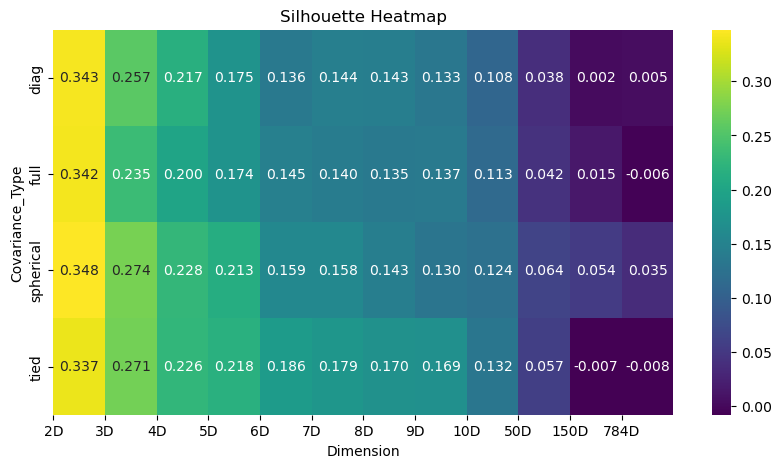

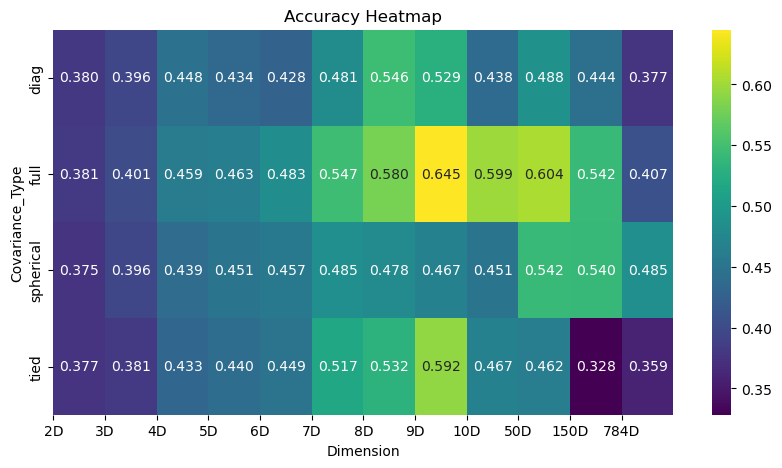

In [73]:
dims_order = [2,3,4,5,6,7,8,9,10,50,150,784] 

df = gmm_hw_results_df.copy()
# make a numeric dimension
df["DimNum"] = df["Dimension"].astype(str).str.replace("D","", regex=False).astype(int)

for metric in metrics:
    pivot_df = (
        df.pivot(index="Covariance_Type", columns="DimNum", values=metric)
          .reindex(columns=dims_order)   # enforce order
    )

    plt.figure(figsize=(10,5))
    sns.heatmap(pivot_df, annot=True, fmt=".3f", cmap="viridis")
    plt.title(f"{metric} Heatmap")
    plt.xlabel("Dimension")
    # pretty tick labels
    plt.xticks(ticks=range(len(dims_order)), labels=[f"{d}D" for d in dims_order], rotation=0)
    plt.show()


### Test

In [8]:
# Reduce to 50 dimensions for clustering
pca = PCA(n_components=50)
X_pca = pca.fit_transform(X)
print("Shape after PCA:", X_pca.shape)

Shape after PCA: (70000, 50)


In [9]:
kmeans = KMeans(n_clusters=10, random_state=42, n_init='auto')
kmeans.fit(X_pca)

# Get cluster assignments
clusters = kmeans.labels_

C:\Users\Admin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index (ARI): 0.3648015626135431


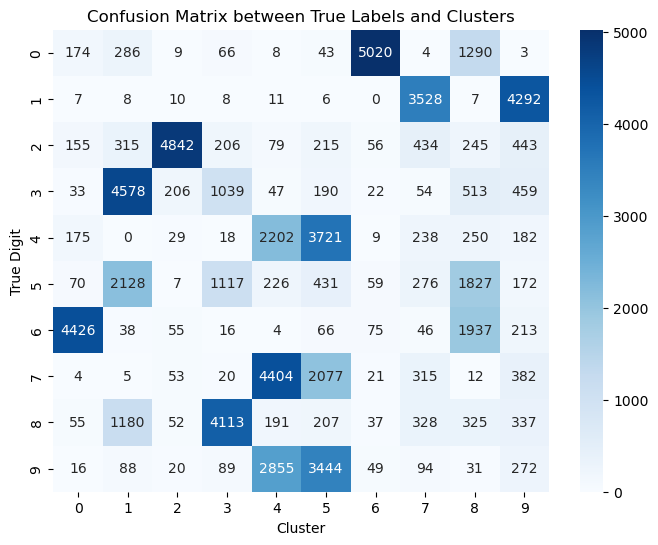

In [10]:
from sklearn.metrics import adjusted_rand_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

ari = adjusted_rand_score(y, clusters)
print("Adjusted Rand Index (ARI):", ari)

# Confusion matrix (to visually inspect alignment)
cm = confusion_matrix(y, clusters)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Cluster")
plt.ylabel("True Digit")
plt.title("Confusion Matrix between True Labels and Clusters")
plt.show()


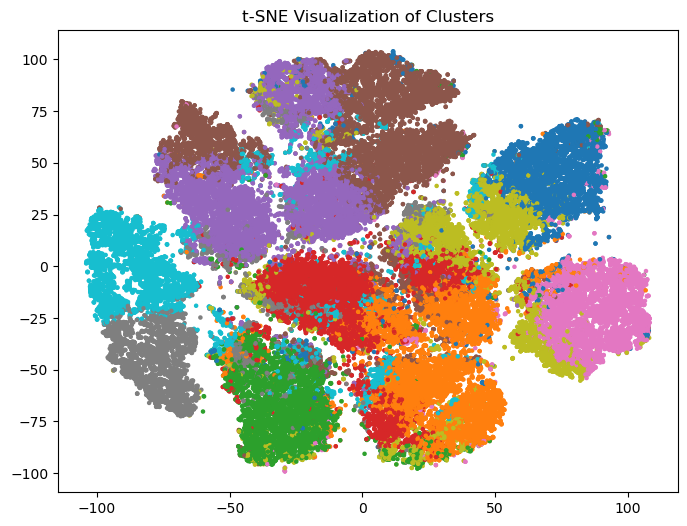

In [11]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_pca)

# Plot t-SNE colored by cluster
plt.figure(figsize=(8, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=clusters, cmap='tab10', s=5)
plt.title("t-SNE Visualization of Clusters")
plt.show()
